# *ANÁLISIS SOBRE LA CALIDAD EL AIRE EN MADRID*

*Rafael Andreo de la Vega*

1. Dataset escogido y objetivos del estudio
2. Preparación del dataset
   1. Lectura y merge de varios ficheros
   2. Depuración y limpieza del dataset
3. Exploración y visualización de la información
4. Correlación entre variables
5. Conclusiones


A raiz del reciente debate sobre las elecciones municipales y autonómicas, dentro del ámbito del Ayuntamiento de Madrid se mencionó mucho la calidad del aire de la ciudad. Investigando, se encontro una página web oficial del ayuntamiento que ofrecía datos recogidos por unas estaciones de medición situadas en diferentes puntos de la capital. Provocado por los comentarios de dicho debate, he decidido realizar el trabajo basándome en los datos oficiales proporcionados, sobre los cuales realizaremos análisis y procesado según los conocimientos adquiridos en la asignatura.

En la página web se pueden encontrar datos en tiempo real del análisis en estos momentos o datos diarios obtenidos desde el año de 2001. Se ha decidio trabajar sobre este último dataset, ya que tenemos una mayor evolución temporal de datos y creemos que se puede ver una evolución más significativa (ya que abarca mayor tiempo)

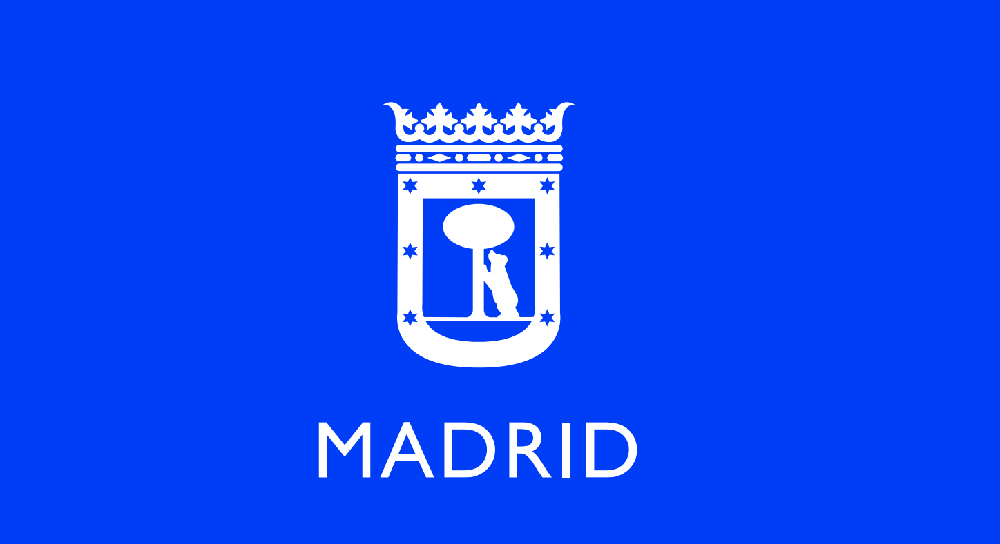

## 1. Descripción del dataset

La página web nos da la opción de descargar el fichero como .txt, .csv o .xml. Por sencillez se ha decidio utilizar los ficheros .csv. En cada fichero se recogen las medidas diarias (media aritmética de los 23 valores horarios de cada día) por cada estación de control. Yendo más al detalle, observamos las siguientes columnas (obtenidas de la página web: https://datos.madrid.es/FWProjects/egob/Catalogo/MedioAmbiente/Aire/Ficheros/Interprete_ficheros_%20calidad_%20del_%20aire_global.pdf) :

- PROVINCIA: contiene el identificador de la provincia. Al ser datos sólo de la Comunidad de Madrid, tendrá sólo un valor.
- MUNICIPIO: contiene el identificador del municipio. Al ser datos sólo de la ciudad de Madrid, tendrá un solo valor.
- ESTACIÓN: contiene el identificador de la estación metereológica. 
- MAGNITUD: indica la unidad de medida sobre la que se hace la medición.
- PUNTO_MUESTREO: es una combinación entre todas las anteriores, más la técnica de muestreo (cómo obtienen los datos).
- ANO: indica el año en el que se realizó la medición.
- MES: indica el mes en el que se realizó la medición.
- D01: valor de la medición para el día 1.
- VO1: indica si el valor de la medición es válido ('V' si es válido, 'N' si no es válido)
- D02: valor de la medición para el día 2.
- V02: validez de la medición.
- ...
- D31: valor de la medición para el día 31.
- V31: validez de la medición para el día 31.

Una vez observadas las columnas, su contenido y la forma en la que están formadas se llega a las siguientes conclusiones/observaciones:

- Existe un fichero .csv para cada año que contiene medidas (por tanto, cargaremos en total 23 ficheros de medidas, que posteriormente unificaremos)
- Para los meses que tengan 28 o 30 días, los datos de las columnas correspondientes a los días excedidos apareceran como no válidos ('N')


En el pdf indicado, además del detalle indicado de las columnas anteriores, podemos encontrar una tabla donde se nos indica las magnitudes existentes y las técnicas de medida que se utilizan para dichas magnitues (ambos campos contenidos en el valor de *PUNTO_MUESTREO*. La información mostrada es la siguiente:

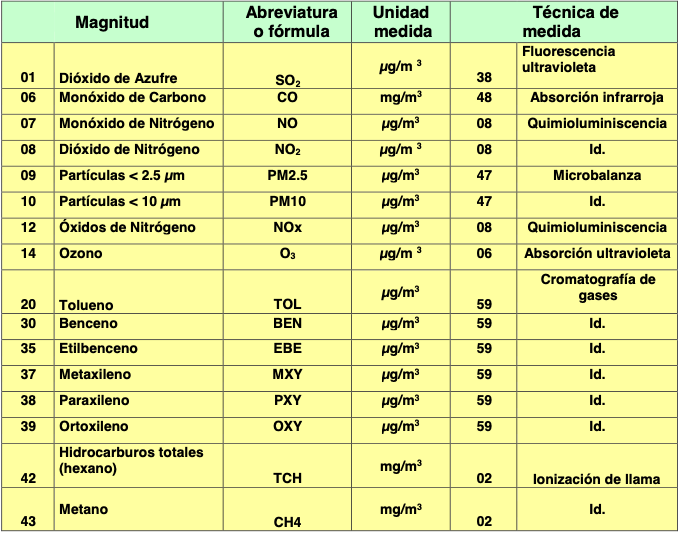

Como creemos que puede ser interesante la información de esa tabla, vamos a crearla manualmente y cargarla en nuestro análisis.

Adicional al fichero comentado anteriormente, existe otro fichero en la página que nos da la información de las estaciones. Concretamente, el fichero tiene los siguientes campos (obtenidos de la siguiente fuente de información: https://datos.madrid.es/FWProjects/egob/Catalogo/MedioAmbiente/Aire/Ficheros/Estructura_C.A.Estaciones.pdf):


- CODIGO: identificador de la estación. Es la combinación de la provincia, municipio y estación que comentábamos antes (separadas las 3 medidas por un '0').
- CODIGO_CORTO: identificador corto de la estación. Coincide con la columna anterior 'ESTACIÓN' y con las últimas 2 cifras del campo anterior.
- ESTACION: nombre de la estación.
- DIRECCION: dirección de la estación.
- LONGITUD_ETRS89: longitud según el Sistema Europeo de Referencia Terrestre. 
- LATITUD_ETRS89: latitud según el Sistema Europeo de Referencia Terrestre.
- ALTITUD: altura en metros sobre el nivel del mar.
- COD_TIPO: código del tipo de estación.
- NOM_TIPO: nombre del tipo de estación.
- NO2: dióxigo de nitrógeno. Si el campo contiene una X indica que se mide ese parámetro en la estación. 
- SO2: dióxido de azufre. Si el campo contiene una X indica que se mide ese parámetro en la estación.
- ... [Más medidas que se comportan igual que las anteriores]
- COD_VIA: código de la vía. 
- VIA_CLASE: clase de la vía (si es una calle, una plaza...).
- VIA_PAR: artículo intermedio del nombre de la vía (del, de...).
- VIA_NOMBRE: nombre de la vía. Junto a los últimos dos campos, forman el nombre completo que se usa en el mundo real ('[Calle] [del] [Príncipe de Vergara]').
- FECHA ALTA: fecha de alta de la estación.
- COORDENADA_X_ETRS89: coordenada geográfica X expresada en el Sistema Europeo de Referencia Terrestre.
- COORDENADA_Y_ETRS89: coordenada geográfica Y expresada en el Sistema Europeo de Referencia Terrestre.
- LONGITUD: longitud geográfica expredsada en datos decimales.
- LATITUD: latitud geográfica expresada en datos decimales.

Una vez comentados por encima los dos dataset sobre los que trabajaremos, empezamos la carga de datos y el procesamiento de los mismos

## 2. Preparación del dataset

### 2.1. Lectura de varios ficheros

In [2]:
# Importamos las librerías necesarias
import os
import pandas as pd
import numpy as np
import folium # HAY QUE INSTALAR LA LIBRERIA: pip install folium
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [3]:
# Descargamos directamente los datos en un dataframe, uno por año, ya que tenemos un archivo por cada año
df_2023 = pd.read_csv('https://datos.madrid.es/datosabiertos/MEDIOAMBIENTE/CALIDAD_DEL_AIRE/2023/04/datos202304.csv', sep=';')
df_2022 = pd.read_csv('https://datos.madrid.es/datosabiertos/MEDIOAMBIENTE/CALIDAD_DEL_AIRE/2022/12/datos202212.csv', sep=';')
df_2021 = pd.read_csv('https://datos.madrid.es/datosabiertos/MEDIOAMBIENTE/CALIDAD_DEL_AIRE/2021/12/datos202112.csv', sep=';')
df_2020 = pd.read_csv('https://datos.madrid.es/datosabiertos/MEDIOAMBIENTE/CALIDAD_DEL_AIRE/2020/12/datos202012.csv', sep=';')
df_2019 = pd.read_csv('https://datos.madrid.es/datosabiertos/MEDIOAMBIENTE/CALIDAD_DEL_AIRE/2019/12/datos201912.csv', sep=';')
df_2018 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos201812.CSV', sep=';')
df_2017 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos17.csv', sep=';')
df_2016 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos201612.csv', sep=';')
df_2015 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos15.csv', sep=';')
df_2014 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos14.csv', sep=';')
df_2013 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos13.csv', sep=';')
df_2012 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos12.csv', sep=';')
df_2011 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos11.csv', sep=';')
df_2010 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos10.csv', sep=';')
df_2009 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos09.csv', sep=';')
df_2008 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos08.csv', sep=';')
df_2007 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos07.csv', sep=';')
df_2006 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos06.csv', sep=';')
df_2005 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos05.csv', sep=';')
df_2004 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos04.csv', sep=';')
df_2003 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos03.csv', sep=';')
df_2002 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos02.csv', sep=';')
df_2001 = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/201410/datos01.csv', sep=';')

In [4]:
# Descargo en un df la información de las estaciones. Utilizamos utf-8 porque hay registros que tienen acentos
df_estaciones = pd.read_csv('https://datos.madrid.es/egobfiles/MANUAL/212629/informacion_estaciones_red_calidad_aire.csv', sep=';', encoding='utf-8')

In [5]:
# Cargo la tabla manual que hemos creado pcon las magnitudes, unidades y técnicas de medida
ruta_fichero = os.path.join('tabla_magnitudes.csv')
df_magnitudes = pd.read_csv(ruta_fichero, sep='|', index_col=0)
display(df_magnitudes)

,Descripcion_Magnitud,Fórmula,Unidad_de_medida,ID_Tecnica_de_medida,Técnica_de_medida
ID_Magnitud,,,,,
1,Dióxido de Azufre,SO2,μg/m 3,38,Fluorescencia ultravioleta
6,Monóxido de Carbono,CO,mg/m3,48,Absorción infrarroja
7,Monóxido de Nitrógeno,NO,μg/m3,8,Quimioluminiscencia
8,Dióxido de Nitrógeno,NO2,μg/m 3,8,Quimioluminiscencia
9,Partículas < 2.5 μm,PM2.5,μg/m3,47,Microbalanza
10,Partículas < 10 μm,PM10,μg/m3,47,Microbalanza
12,Óxidos de Nitrógeno,NOx,μg/m3,8,Quimioluminiscencia
14,Ozono,O3,μg/m 3,6,Absorción ultravioleta
20,Tolueno,TOL,μg/m3,59,Cromatografía de gases


### 2.2. 'df_2XXX'

#### 2.2.1. Análisis exploratorio

In [6]:
# Vamos a realizar una exploración inicial. Para ello visualizamos las primeras filas de 6 de los dataframes de medidas
# (repartidos entre todos los años), para ver que tienen el mismo formato conforme pasan los años.
# De igual forma, mostramos el número de filas y columnas de cada uno.
display(df_2023.head())
print(df_2023.shape)
display(df_2019.head())
print(df_2019.shape)
display(df_2015.head())
print(df_2015.shape)
display(df_2010.head())
print(df_2010.shape)
display(df_2006.head())
print(df_2006.shape)
display(df_2001.head())
print(df_2001.shape)

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2023,1,1.0,V,1.0,...,2.0,V,2.0,V,1.0,V,2.0,V,4.0,V
1,28,79,4,1,28079004_1_38,2023,2,3.0,V,4.0,...,2.0,V,2.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2023,3,3.0,V,2.0,...,1.0,V,1.0,V,1.0,V,1.0,V,1.0,V
3,28,79,4,1,28079004_1_38,2023,4,1.0,V,1.0,...,2.0,V,1.0,V,1.0,V,1.0,V,0.0,N
4,28,79,4,6,28079004_6_48,2023,1,0.4,V,0.3,...,0.4,V,0.4,V,0.4,V,0.5,V,0.7,V


(522, 69)


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2019,1,18.0,V,20.0,...,15.0,V,15.0,V,15.0,V,14.0,V,14.0,V
1,28,79,4,1,28079004_1_38,2019,2,13.0,V,13.0,...,19.0,V,20.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2019,3,18.0,V,18.0,...,6.0,V,7.0,V,6.0,V,4.0,V,4.0,V
3,28,79,4,1,28079004_1_38,2019,4,3.0,V,4.0,...,3.0,V,2.0,V,2.0,V,2.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2019,5,1.0,V,1.0,...,2.0,V,1.0,V,1.0,V,1.0,V,2.0,V


(1836, 69)


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2015,1,15.0,V,19.0,...,13.0,V,14.0,V,10.0,V,6.0,V,7.0,V
1,28,79,4,1,28079004_1_38,2015,2,7.0,V,6.0,...,8.0,V,10.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2015,3,7.0,V,6.0,...,8.0,V,9.0,V,7.0,V,7.0,V,8.0,V
3,28,79,4,1,28079004_1_38,2015,4,6.0,V,6.0,...,5.0,V,6.0,V,5.0,V,6.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2015,5,5.0,V,5.0,...,6.0,V,6.0,V,6.0,V,6.0,V,6.0,V


(1812, 69)


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2010,1,12.0,V,15.0,...,16.0,V,21.0,V,22.0,V,17.0,V,15.0,V
1,28,79,4,1,28079004_1_38,2010,2,18.0,V,20.0,...,15.0,V,13.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2010,3,13.0,V,15.0,...,14.0,V,16.0,V,15.0,V,13.0,V,14.0,V
3,28,79,4,1,28079004_1_38,2010,4,14.0,V,14.0,...,9.0,V,9.0,V,9.0,V,9.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2010,5,8.0,V,8.0,...,9.0,V,9.0,V,9.0,V,9.0,V,9.0,V


(1808, 69)


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2006,1,9.0,V,10.0,...,15.0,V,16.0,V,15.0,V,24.0,V,27.0,V
1,28,79,4,1,28079004_1_38,2006,2,27.0,V,24.0,...,15.0,V,20.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2006,3,16.0,V,18.0,...,13.0,V,10.0,V,10.0,V,14.0,V,13.0,V
3,28,79,4,1,28079004_1_38,2006,4,10.0,V,10.0,...,9.0,V,6.0,V,6.0,V,6.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2006,5,7.0,V,7.0,...,8.0,V,8.0,V,9.0,V,7.0,V,6.0,V


(958, 69)


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2001,1,17.0,V,15.0,...,19.0,V,17.0,V,35.0,V,40.0,V,53.0,V
1,28,79,4,1,28079004_1_38,2001,2,40.0,V,42.0,...,20.0,V,22.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2001,3,19.0,V,18.0,...,14.0,V,15.0,V,17.0,V,20.0,V,19.0,V
3,28,79,4,1,28079004_1_38,2001,4,14.0,V,17.0,...,12.0,V,13.0,V,15.0,V,14.0,V,0.0,N
4,28,79,4,1,28079004_1_38,2001,5,10.0,V,11.0,...,11.0,V,15.0,V,16.0,V,15.0,V,18.0,V


(818, 69)


Como se puede observar en las tablas mostradas, todos los df tienen 69 columnas que coinciden (5 con datos de las estaciones de medida y 64 con datos del día de la medida). Al coincidir las columnas de todos los df, podremos concatenarlos para tenerlos todos en una sola tabla.

In [7]:
# Concatenamos todos los df en uno solo
df_total = pd.concat([df_2023,df_2022,df_2021,df_2020,df_2019,df_2018,df_2017,df_2016,df_2015,
                      df_2014,df_2013,df_2012,df_2011,df_2010,df_2009,df_2008,df_2007,df_2006,
                      df_2006,df_2005,df_2004,df_2003,df_2002,df_2001], axis=0)
display(df_total.head())
display(df_total.tail())
print(df_total.shape)

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
0,28,79,4,1,28079004_1_38,2023,1,1.0,V,1.0,...,2.0,V,2.0,V,1.0,V,2.0,V,4.0,V
1,28,79,4,1,28079004_1_38,2023,2,3.0,V,4.0,...,2.0,V,2.0,V,0.0,N,0.0,N,0.0,N
2,28,79,4,1,28079004_1_38,2023,3,3.0,V,2.0,...,1.0,V,1.0,V,1.0,V,1.0,V,1.0,V
3,28,79,4,1,28079004_1_38,2023,4,1.0,V,1.0,...,2.0,V,1.0,V,1.0,V,1.0,V,0.0,N
4,28,79,4,6,28079004_6_48,2023,1,0.4,V,0.3,...,0.4,V,0.4,V,0.4,V,0.5,V,0.7,V


,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,D27,V27,D28,V28,D29,V29,D30,V30,D31,V31
813,28,79,40,12,28079040_12_8,2001,8,63.0,V,40.0,...,64.0,V,60.0,V,68.0,V,56.0,V,42.0,V
814,28,79,40,12,28079040_12_8,2001,9,26.0,V,36.0,...,122.0,V,79.0,V,124.0,V,88.0,V,0.0,N
815,28,79,40,12,28079040_12_8,2001,10,133.0,V,158.0,...,102.0,V,36.0,V,74.0,V,81.0,V,79.0,V
816,28,79,40,12,28079040_12_8,2001,11,23.0,V,34.0,...,181.0,V,329.0,V,581.0,V,395.0,V,0.0,N
817,28,79,40,12,28079040_12_8,2001,12,323.0,V,187.0,...,621.0,V,306.0,V,251.0,V,292.0,V,183.0,V


(33272, 69)


In [8]:
# Estudiamos la existencia de valores nulos y los tipos de cada columna
display(df_total.info())

<class 'pandas.core.frame.DataFrame'>
Index: 33272 entries, 0 to 817
Data columns (total 69 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   PROVINCIA       33272 non-null  int64  
 1   MUNICIPIO       33272 non-null  int64  
 2   ESTACION        33272 non-null  int64  
 3   MAGNITUD        33272 non-null  int64  
 4   PUNTO_MUESTREO  33272 non-null  object 
 5   ANO             33272 non-null  int64  
 6   MES             33272 non-null  int64  
 7   D01             33272 non-null  float64
 8   V01             33272 non-null  object 
 9   D02             33272 non-null  float64
 10  V02             33272 non-null  object 
 11  D03             33272 non-null  float64
 12  V03             33272 non-null  object 
 13  D04             33272 non-null  float64
 14  V04             33272 non-null  object 
 15  D05             33272 non-null  float64
 16  V05             33272 non-null  object 
 17  D06             33272 non-null  float6

None

Como se puede observar, no hay ningún valor nulo en ninguna de las filas. De igual forma se observa que todos los campos que contienen números tienen tipo 'int64' o 'float64', por lo que no sería necesaria ninguna conversión de datos.

En cuanto a las columnas que indican si la medida es válida o no 'V01','V02',...,'V31', vamos a reemplazar los valores afirmativos (las 'V') por 1 y los valores negativos (las 'N') por 0, ya que consideramos que será mejor para el futuro trato de los datos.


De cara al futuro análisis de los datos, las columnas que nos indican la validez de la medida ('V01','V02',...'V31') nos generan un poco de ruido y sería interesante indicar directamente en las columnas de los valores si las medidas son válidas o no. Para ello, vamos a crearnos unas nuevas columnas con los valores diarios y modificar en ellas dichos valores si la medida es no válida. En esos casos, introduciremos un NaN. Aunque a primera vista pueda parecer contraproducente introducir un NaN, nos servirá para transformar los datos, observarlos en detalle y luego ya modificar dichos valores.

In [9]:
# Creamos una nueva columna que nos indique el dia y le damos el valor que tiene en el día 
# (como duplicando las columnas que ya tenemos, pero que serán nuestras columnas finales)
df_total['01'] = df_total['D01']
df_total['02'] = df_total['D02']
df_total['03'] = df_total['D03']
df_total['04'] = df_total['D04']
df_total['05'] = df_total['D05']
df_total['06'] = df_total['D06']
df_total['07'] = df_total['D07']
df_total['08'] = df_total['D08']
df_total['09'] = df_total['D09']
df_total['10'] = df_total['D10']
df_total['11'] = df_total['D11']
df_total['12'] = df_total['D12']
df_total['13'] = df_total['D13']
df_total['14'] = df_total['D14']
df_total['15'] = df_total['D15']
df_total['16'] = df_total['D16']
df_total['17'] = df_total['D17']
df_total['18'] = df_total['D18']
df_total['19'] = df_total['D19']
df_total['20'] = df_total['D20']
df_total['21'] = df_total['D21']
df_total['22'] = df_total['D22']
df_total['23'] = df_total['D23']
df_total['24'] = df_total['D24']
df_total['25'] = df_total['D25']
df_total['26'] = df_total['D26']
df_total['27'] = df_total['D27']
df_total['28'] = df_total['D28']
df_total['29'] = df_total['D29']
df_total['30'] = df_total['D30']
df_total['31'] = df_total['D31']

# Ahora cambiamos los valores y añadimos NaN si el valor es no válido
df_total.loc[df_total['V01'] == 'N', '01'] = np.nan
df_total.loc[df_total['V02'] == 'N', '02'] = np.nan
df_total.loc[df_total['V03'] == 'N', '03'] = np.nan
df_total.loc[df_total['V04'] == 'N', '04'] = np.nan
df_total.loc[df_total['V05'] == 'N', '05'] = np.nan
df_total.loc[df_total['V06'] == 'N', '06'] = np.nan
df_total.loc[df_total['V07'] == 'N', '07'] = np.nan
df_total.loc[df_total['V08'] == 'N', '08'] = np.nan
df_total.loc[df_total['V09'] == 'N', '09'] = np.nan
df_total.loc[df_total['V10'] == 'N', '10'] = np.nan
df_total.loc[df_total['V11'] == 'N', '11'] = np.nan
df_total.loc[df_total['V12'] == 'N', '12'] = np.nan
df_total.loc[df_total['V13'] == 'N', '13'] = np.nan
df_total.loc[df_total['V14'] == 'N', '14'] = np.nan
df_total.loc[df_total['V15'] == 'N', '15'] = np.nan
df_total.loc[df_total['V16'] == 'N', '16'] = np.nan
df_total.loc[df_total['V17'] == 'N', '17'] = np.nan
df_total.loc[df_total['V18'] == 'N', '18'] = np.nan
df_total.loc[df_total['V19'] == 'N', '19'] = np.nan
df_total.loc[df_total['V20'] == 'N', '20'] = np.nan
df_total.loc[df_total['V21'] == 'N', '21'] = np.nan
df_total.loc[df_total['V22'] == 'N', '22'] = np.nan
df_total.loc[df_total['V23'] == 'N', '23'] = np.nan
df_total.loc[df_total['V24'] == 'N', '24'] = np.nan
df_total.loc[df_total['V25'] == 'N', '25'] = np.nan
df_total.loc[df_total['V26'] == 'N', '26'] = np.nan
df_total.loc[df_total['V27'] == 'N', '27'] = np.nan
df_total.loc[df_total['V28'] == 'N', '28'] = np.nan
df_total.loc[df_total['V29'] == 'N', '29'] = np.nan
df_total.loc[df_total['V30'] == 'N', '30'] = np.nan
df_total.loc[df_total['V31'] == 'N', '31'] = np.nan
df_total.sample(10)

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,D01,V01,D02,...,22,23,24,25,26,27,28,29,30,31
756,28,79,35,1,28079035_1_38,2019,1,20.00,V,20.00,...,13.0,12.00,13.00,13.00,15.00,12.00,12.00,12.00,11.00,11.0
1176,28,79,47,10,28079047_10_47,2014,8,30.00,V,17.00,...,19.0,12.00,18.00,26.00,23.00,23.00,32.00,19.00,22.00,21.0
1022,28,79,39,7,28079039_7_8,2016,3,79.00,V,51.00,...,7.0,20.00,12.00,25.00,14.00,4.00,10.00,10.00,33.00,6.0
264,28,79,11,20,28079011_20_59,2019,1,2.00,V,7.70,...,1.4,0.70,1.40,1.60,1.20,0.80,0.80,0.90,0.80,0.5
230,28,79,11,20,28079011_20_59,2013,3,3.40,V,3.30,...,6.1,3.90,1.80,2.00,2.10,2.70,1.40,1.20,1.50,1.9
1101,28,79,40,7,28079040_7_8,2012,4,10.00,V,13.00,...,3.0,5.00,4.00,5.00,6.00,11.00,4.00,2.00,5.00,NaN
620,28,79,27,43,28079027_43_2,2007,9,1.27,V,1.37,...,1.2,1.18,1.25,1.28,1.15,1.17,1.21,1.31,1.27,NaN
1190,28,79,48,7,28079048_7_8,2018,9,10.00,V,4.00,...,6.0,1.00,2.00,7.00,3.00,10.00,14.00,9.00,3.00,NaN
862,28,79,36,7,28079036_7_8,2020,11,14.00,V,11.00,...,15.0,41.00,48.00,40.00,13.00,8.00,14.00,9.00,32.00,NaN
1460,28,79,55,20,28079055_20_59,2013,9,0.80,V,2.30,...,1.6,3.20,5.00,4.60,4.00,2.70,0.90,0.50,1.80,NaN


Una vez hemos sustituido nuestros valores y creado columnas a parte, vamos a eliminar las columnas 'D01','D02',...','D31' y las columnas 'V01','V02',...'V31':

In [10]:
df_total.drop(['D01','V01','D02','V02','D03','V03','D04','V04','D05','V05','D06','V06','D07','V07','D08','V08','D09','V09','D10','V10',
              'D11','V11','D12','V12','D13','V13','D14','V14','D15','V15','D16','V16','D17','V17','D18','V18','D19','V19','D20','V20',
              'D21','V21','D22','V22','D23','V23','D24','V24','D25','V25','D26','V26','D27','V27','D28','V28','D29','V29','D30','V30','D31','V31'],
              axis=1, inplace=True)
display(df_total)

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,01,02,03,...,22,23,24,25,26,27,28,29,30,31
0,28,79,4,1,28079004_1_38,2023,1,1.0,1.0,1.0,...,1.0,3.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,4.0
1,28,79,4,1,28079004_1_38,2023,2,3.0,4.0,5.0,...,NaN,NaN,2.0,2.0,2.0,2.0,2.0,NaN,NaN,NaN
2,28,79,4,1,28079004_1_38,2023,3,3.0,2.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,28,79,4,1,28079004_1_38,2023,4,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,NaN
4,28,79,4,6,28079004_6_48,2023,1,0.4,0.3,0.4,...,0.3,0.5,0.4,0.4,0.5,0.4,0.4,0.4,0.5,0.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,28,79,40,12,28079040_12_8,2001,8,63.0,40.0,60.0,...,133.0,146.0,147.0,57.0,39.0,64.0,60.0,68.0,56.0,42.0
814,28,79,40,12,28079040_12_8,2001,9,26.0,36.0,64.0,...,42.0,30.0,66.0,127.0,140.0,122.0,79.0,124.0,88.0,NaN
815,28,79,40,12,28079040_12_8,2001,10,133.0,158.0,104.0,...,81.0,72.0,127.0,94.0,108.0,102.0,36.0,74.0,81.0,79.0
816,28,79,40,12,28079040_12_8,2001,11,23.0,34.0,32.0,...,110.0,96.0,181.0,162.0,277.0,181.0,329.0,581.0,395.0,NaN


#### 2.2.2. Análisis estadístico

In [11]:
# Hacemos una primera mirada sobre el descriptivos para campos numéricos
display(df_total.describe())

,PROVINCIA,MUNICIPIO,ESTACION,MAGNITUD,ANO,MES,01,02,03,04,...,22,23,24,25,26,27,28,29,30,31
count,33272.0,33272.0,33272.000000,33272.000000,33272.000000,33272.000000,32647.000000,32671.000000,32686.000000,32666.000000,...,32590.000000,32583.000000,32641.000000,32672.000000,32676.000000,32673.000000,32657.000000,30372.000000,29861.000000,19030.000000
mean,28.0,79.0,31.638765,13.036698,2012.943917,6.441693,28.424753,29.122378,30.330955,30.662817,...,30.824454,31.405539,30.330451,29.241080,30.701141,30.127100,30.390717,30.164328,30.867208,31.309397
std,0.0,0.0,17.163076,10.705391,5.994395,3.466473,39.950180,41.204007,43.060450,46.801270,...,45.785335,45.183507,41.282308,39.555407,42.585801,42.145191,43.477973,43.478860,45.078808,46.253542
min,28.0,79.0,4.000000,1.000000,2001.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.0,79.0,17.000000,7.000000,2008.000000,3.000000,2.000000,2.000000,2.200000,2.000000,...,2.200000,2.400000,2.300000,2.000000,2.500000,2.300000,2.000000,2.000000,2.100000,2.100000
50%,28.0,79.0,35.000000,10.000000,2013.000000,6.000000,15.000000,15.000000,16.000000,15.000000,...,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,15.000000,16.000000
75%,28.0,79.0,47.000000,14.000000,2018.000000,9.000000,41.000000,42.000000,43.000000,42.000000,...,43.000000,44.000000,43.000000,43.000000,44.000000,43.000000,43.000000,43.000000,43.000000,43.000000
max,28.0,79.0,60.000000,44.000000,2023.000000,12.000000,557.000000,666.000000,627.000000,838.000000,...,714.000000,731.000000,754.000000,737.000000,668.000000,855.000000,668.000000,772.000000,741.000000,619.000000


Con la tabla anterior se pueden observar una serie de puntos interesantes:
- Se confirma que todos los datos pertenecen a la provincia y a la ciudad de Madrid (un sólo valor para ambas columnas, ya que la media es exacta y no tiene desviación estandar)).
- El valor medio de las medidas para cada día no tiene mucho sentido usarlo, pues está teniendo en cuenta diferentes magnitudes (no es lo mismo medir el Dióxido de Azufre (SO2) que el Tolueno (TOL))

Como todos los registros tienen el mismo valor de provincia y de municipio se pueden eliminar del dataframe, ya que no aportan información adicional y así reducidmos el tamaño de la tabla.

In [12]:
df_total.drop(['PROVINCIA','MUNICIPIO'],
              axis=1, inplace=True)
display(df_total)

,ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,01,02,03,04,05,...,22,23,24,25,26,27,28,29,30,31
0,4,1,28079004_1_38,2023,1,1.0,1.0,1.0,2.0,3.0,...,1.0,3.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,4.0
1,4,1,28079004_1_38,2023,2,3.0,4.0,5.0,3.0,2.0,...,NaN,NaN,2.0,2.0,2.0,2.0,2.0,NaN,NaN,NaN
2,4,1,28079004_1_38,2023,3,3.0,2.0,2.0,2.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,4,1,28079004_1_38,2023,4,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,NaN
4,4,6,28079004_6_48,2023,1,0.4,0.3,0.4,0.4,0.5,...,0.3,0.5,0.4,0.4,0.5,0.4,0.4,0.4,0.5,0.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,40,12,28079040_12_8,2001,8,63.0,40.0,60.0,36.0,32.0,...,133.0,146.0,147.0,57.0,39.0,64.0,60.0,68.0,56.0,42.0
814,40,12,28079040_12_8,2001,9,26.0,36.0,64.0,71.0,51.0,...,42.0,30.0,66.0,127.0,140.0,122.0,79.0,124.0,88.0,NaN
815,40,12,28079040_12_8,2001,10,133.0,158.0,104.0,104.0,111.0,...,81.0,72.0,127.0,94.0,108.0,102.0,36.0,74.0,81.0,79.0
816,40,12,28079040_12_8,2001,11,23.0,34.0,32.0,30.0,29.0,...,110.0,96.0,181.0,162.0,277.0,181.0,329.0,581.0,395.0,NaN


In [13]:
# Vamos a intentar agrupar por PUNTO_MUESTREO para ver los estadísticos por estación
display(df_total.groupby(by='PUNTO_MUESTREO').describe())

ESTACION                                          MAGNITUD   
                  count  mean  std   min   25%   50%   75%   max    count   
PUNTO_MUESTREO                                                              
28079004_12_8     276.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0    276.0  \
28079004_1_38     276.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0    276.0   
28079004_6_48     276.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0    276.0   
28079004_7_8      276.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0    276.0   
28079004_8_8      276.0   4.0  0.0   4.0   4.0   4.0   4.0   4.0    276.0   
...                 ...   ...  ...   ...   ...   ...   ...   ...      ...   
28079060_10_47    160.0  60.0  0.0  60.0  60.0  60.0  60.0  60.0    160.0   
28079060_12_8     160.0  60.0  0.0  60.0  60.0  60.0  60.0  60.0    160.0   
28079060_14_6     160.0  60.0  0.0  60.0  60.0  60.0  60.0  60.0    160.0   
28079060_7_8      160.0  60.0  0.0  60.0  60.0  60.0  60.0  60.0    160.0   
28079060_8_8      160.0  60.0  0.0  60.0  60.0  60.0  60.0  60.0    160.0   

                      ...     30            31                                 
                mean  ...    75%    max  count        mean         std   min   
PUNTO_MUESTREO        ...                                                      
28079004_12_8   12.0  ...  148.0  593.0  158.0  118.113924  103.405144  12.0  \
28079004_1_38    1.0  ...   10.0   40.0  158.0    9.050633    6.495268   1.0   
28079004_6_48    6.0  ...    0.6    2.5  157.0    0.487898    0.338615   0.1   
28079004_7_8     7.0  ...   56.0  330.0  158.0   45.056962   56.186365   1.0   
28079004_8_8     8.0  ...   64.0  117.0  158.0   49.044304   22.017753   9.0   
...              ...  ...    ...    ...    ...         ...         ...   ...   
28079060_10_47  10.0  ...   21.0   54.0   92.0   17.336957    8.855714   4.0   
28079060_12_8   12.0  ...   57.0  245.0   92.0   51.760870   46.999736   9.0   
28079060_14_6   14.0  ...   77.0  114.0   92.0   55.310543   28.524201   4.0   
28079060_7_8     7.0  ...   10.0  101.0   92.0   12.902174   18.959795   1.0   
28079060_8_8     8.0  ...   41.0   90.0   92.0   31.902174   19.274797   4.0   

                                           
                 25%   50%     75%    max  
PUNTO_MUESTREO                             
28079004_12_8   49.0  83.0  148.00  525.0  
28079004_1_38    6.0   7.0   11.00   53.0  
28079004_6_48    0.3   0.4    0.60    2.3  
28079004_7_8    10.0  21.0   56.00  282.0  
28079004_8_8    32.0  47.5   64.00  108.0  
...              ...   ...     ...    ...  
28079060_10_47  10.0  16.0   22.25   59.0  
28079060_12_8   22.0  32.0   67.00  222.0  
28079060_14_6   29.5  57.5   81.00  114.0  
28079060_7_8     2.0   4.0   18.00   91.0  
28079060_8_8    18.0  25.5   44.50   83.0  

[157 rows x 280 columns]

De la tabla anterior podemos extraer la siguiente conclusión:
- No todas las estaciones tienen el mismo tiempo -> Como no tienen el mismo número de medidas significa que o bien se instalaron más tarde o bien que las desmantelaron hace tiempo.

### 2.3. 'df_estaciones'

#### 2.3.1. Análisis exploratorio

In [14]:
# Ahora replicamos la misma observación con el df de las estaciones
display(df_estaciones.head())
print(df_estaciones.shape)

,CODIGO,CODIGO_CORTO,ESTACION,DIRECCION,LONGITUD_ETRS89,LATITUD_ETRS89,ALTITUD,COD_TIPO,NOM_TIPO,NO2,...,BTX,COD_VIA,VIA_CLASE,VIA_PAR,VIA_NOMBRE,Fecha alta,COORDENADA_X_ETRS89,COORDENADA_Y_ETRS89,LONGITUD,LATITUD
0,28079004,4,Plaza de España,Plaza de España,"3°42'43.91""O","40°25'25.98""N",637,UT,Urbana tráfico,X,...,NaN,273600,PLAZA,DE,ESPAÑA,01/12/1998,"439579,3291","4475049,263",-3.712257,40.423882
1,28079008,8,Escuelas Aguirre,Entre C/ Alcalá y C/ O’ Donell,"3°40'56.22""O","40°25'17.63""N",672,UT,Urbana tráfico,X,...,X,18900,CALLE,DE,ALCALA,01/12/1998,"442117,2366","4474770,696",-3.682316,40.421553
2,28079011,11,Ramón y Cajal,Avda. Ramón y Cajal esq. C/ Príncipe de Vergara,"3°40'38.50""O","40°27'5.29""N",708,UT,Urbana tráfico,X,...,X,610450,CALLE,DEL,PRINCIPE DE VERGARA,01/12/1998,"442564,0457","4478088,595",-3.677349,40.451473
3,28079016,16,Arturo Soria,C/ Arturo Soria esq. C/ Vizconde de los Asilos,"3°38'21.17""O","40°26'24.20""N",695,UF,Urbana fondo,X,...,NaN,798700,CALLE,DEL,VIZCONDE DE LOS ASILOS,01/12/1998,"445786,1729","4476796,019",-3.639242,40.440046
4,28079017,17,Villaverde,C/ Juan Peñalver,"3°42'47.89""O","40°20'49.74""N",601,UF,Urbana fondo,X,...,NaN,417200,CALLE,DE,JUAN PEÑALVER,01/12/1998,"439420,7015","4466532,455",-3.713317,40.347147


(24, 25)


Con la impresión del df de las estaciones podemos observar que existen 24 estaciones repartidas por la capital. También observamos que la información de las coordenadas de posición se repite varias veces en diferentes formatos, por lo que eliminaremos varias de las columnas que repiten este valor, quedándonos sólo con las coordenadas en medida decimal (LONGITUD y LATITUD).

Tampoco sería necesaria la información detallada del nombre de la ubicación de la estación (columnas COD_VIA, VIA_CLASE, VIA_PAR y VIA_NOMBRE), ya que esa información está contenida en la columna DIRECCIÓN.

In [15]:
# Eliminamos las columnas indicadas arriba, quedándonos sólo con las necesarias
df_estaciones = df_estaciones.loc[:,['CODIGO','CODIGO_CORTO','ESTACION','DIRECCION','ALTITUD','COD_TIPO','NOM_TIPO','NO2','SO2','CO',
                                     'PM10','PM2_5','O3','BTX','Fecha alta','LONGITUD','LATITUD']]
display(df_estaciones.head())

,CODIGO,CODIGO_CORTO,ESTACION,DIRECCION,ALTITUD,COD_TIPO,NOM_TIPO,NO2,SO2,CO,PM10,PM2_5,O3,BTX,Fecha alta,LONGITUD,LATITUD
0,28079004,4,Plaza de España,Plaza de España,637,UT,Urbana tráfico,X,X,X,NaN,NaN,NaN,NaN,01/12/1998,-3.712257,40.423882
1,28079008,8,Escuelas Aguirre,Entre C/ Alcalá y C/ O’ Donell,672,UT,Urbana tráfico,X,X,X,X,X,X,X,01/12/1998,-3.682316,40.421553
2,28079011,11,Ramón y Cajal,Avda. Ramón y Cajal esq. C/ Príncipe de Vergara,708,UT,Urbana tráfico,X,NaN,NaN,NaN,NaN,NaN,X,01/12/1998,-3.677349,40.451473
3,28079016,16,Arturo Soria,C/ Arturo Soria esq. C/ Vizconde de los Asilos,695,UF,Urbana fondo,X,NaN,NaN,NaN,NaN,X,NaN,01/12/1998,-3.639242,40.440046
4,28079017,17,Villaverde,C/ Juan Peñalver,601,UF,Urbana fondo,X,NaN,NaN,NaN,NaN,X,NaN,01/12/1998,-3.713317,40.347147


In [16]:
# Estudiamos la existencia de valores nulos y los tipos de cada columna
display(df_estaciones.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   CODIGO        24 non-null     int64  
 1   CODIGO_CORTO  24 non-null     int64  
 2   ESTACION      24 non-null     object 
 3   DIRECCION     24 non-null     object 
 4   ALTITUD       24 non-null     int64  
 5   COD_TIPO      24 non-null     object 
 6   NOM_TIPO      24 non-null     object 
 7   NO2           24 non-null     object 
 8   SO2           4 non-null      object 
 9   CO            4 non-null      object 
 10  PM10          13 non-null     object 
 11  PM2_5         8 non-null      object 
 12  O3            13 non-null     object 
 13  BTX           6 non-null      object 
 14  Fecha alta    24 non-null     object 
 15  LONGITUD      24 non-null     float64
 16  LATITUD       24 non-null     float64
dtypes: float64(2), int64(3), object(12)
memory usage: 3.3+ KB


None

Para las columnas que indican si una estación mide una magnitud o no, se observará una 'X' si la estación puede medir esa magnitud y un NaN si la estación no puede medir esa magnitud. Con esa descripción, pensamos que los más acertado será sistituir los NaN por 0 y las 'X' por 1.

In [17]:
# Sustituimos los valores comentados anteriormente
columnas = df_estaciones.loc[:,['NO2','SO2','CO','PM10','PM2_5','O3','BTX']]

for i in columnas:
    df_estaciones[i] = (df_estaciones[i]=='X').astype(int)

display(df_estaciones.head())

,CODIGO,CODIGO_CORTO,ESTACION,DIRECCION,ALTITUD,COD_TIPO,NOM_TIPO,NO2,SO2,CO,PM10,PM2_5,O3,BTX,Fecha alta,LONGITUD,LATITUD
0,28079004,4,Plaza de España,Plaza de España,637,UT,Urbana tráfico,1,1,1,0,0,0,0,01/12/1998,-3.712257,40.423882
1,28079008,8,Escuelas Aguirre,Entre C/ Alcalá y C/ O’ Donell,672,UT,Urbana tráfico,1,1,1,1,1,1,1,01/12/1998,-3.682316,40.421553
2,28079011,11,Ramón y Cajal,Avda. Ramón y Cajal esq. C/ Príncipe de Vergara,708,UT,Urbana tráfico,1,0,0,0,0,0,1,01/12/1998,-3.677349,40.451473
3,28079016,16,Arturo Soria,C/ Arturo Soria esq. C/ Vizconde de los Asilos,695,UF,Urbana fondo,1,0,0,0,0,1,0,01/12/1998,-3.639242,40.440046
4,28079017,17,Villaverde,C/ Juan Peñalver,601,UF,Urbana fondo,1,0,0,0,0,1,0,01/12/1998,-3.713317,40.347147


#### 2.3.2. Análisis estadístico

In [18]:
# Hacemos una primera mirada sobre el descriptivos para campos numéricos
display(df_estaciones.describe())

,CODIGO,CODIGO_CORTO,ALTITUD,NO2,SO2,CO,PM10,PM2_5,O3,BTX,LONGITUD,LATITUD
count,2.400000e+01,24.00000,24.000000,24.0,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,2.807904e+07,37.75000,658.500000,1.0,0.166667,0.166667,0.541667,0.333333,0.541667,0.250000,-3.679311,40.434426
std,1.799094e+01,17.99094,38.232697,0.0,0.380693,0.380693,0.508977,0.481543,0.508977,0.442326,0.048910,0.042876
min,2.807900e+07,4.00000,600.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.774610,40.347147
25%,2.807902e+07,22.50000,626.750000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.711716,40.405489
50%,2.807904e+07,39.50000,661.000000,1.0,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,-3.687779,40.431886
75%,2.807905e+07,54.25000,683.750000,1.0,0.000000,0.000000,1.000000,1.000000,1.000000,0.250000,-3.649974,40.463168
max,2.807906e+07,60.00000,728.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-3.580026,40.518070


De la tabla anterior podemos extraer las siguientes conclusiones:
- Todas las estaciones se situan a una altitud media de 658 metros sobre el nivel del mar (según la Wikipedia Madrid se encuentra situada a un nivel de 657 metros sobre el nivel del mar, por lo que podemos afirmar que las medidas son representativas de la ciudad de Madrid)
- Como curiosidad, la Longitud y Latitud media coincide con el número 50 de la Calle de Diego de León, que está bastante centrada (como podemos ver en la siguiente foto):

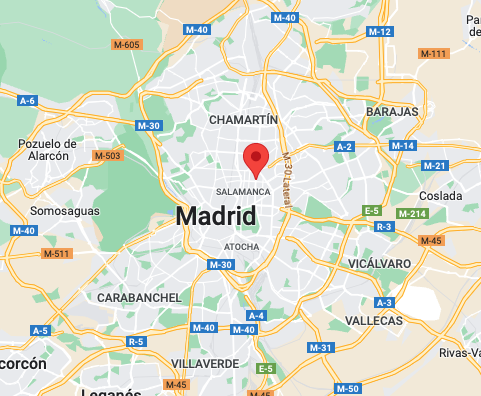

### 2.4. Merge de tablas

Una vez vistos todos los datos de cada df vemos interesante añadir información del Tipo de ZONA (NOM_TIPO en el df_estaciones) al df con las medidas, así podremos agrupar dichas medidas por zonas de sus instrumentos de medidas (y comparar resultados en función de la situación geográfica).

In [19]:
# Unificamos los df para combinar sus datos con las columnas mencionadas
df_total_combinado = pd.merge(df_total,df_estaciones.loc[:,['CODIGO_CORTO','ESTACION','NOM_TIPO','LONGITUD','LATITUD']], how='left', left_on='ESTACION', right_on='CODIGO_CORTO')

# Eliminamos la columna CODIGO_CORTO ya que es una copia de ESTACION
df_total_combinado.drop('CODIGO_CORTO',axis=1, inplace=True)

df_total_combinado.rename(columns={'ESTACION_x':'ID_ESTACION', 'ESTACION_y':'NOMBRE_ESTACION'}, inplace=True)

display(df_total_combinado.head())
print(df_total_combinado.shape)

,ID_ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,01,02,03,04,05,...,26,27,28,29,30,31,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD
0,4,1,28079004_1_38,2023,1,1.0,1.0,1.0,2.0,3.0,...,2.0,2.0,2.0,1.0,2.0,4.0,Plaza de España,Urbana tráfico,-3.712257,40.423882
1,4,1,28079004_1_38,2023,2,3.0,4.0,5.0,3.0,2.0,...,2.0,2.0,2.0,NaN,NaN,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882
2,4,1,28079004_1_38,2023,3,3.0,2.0,2.0,2.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,Plaza de España,Urbana tráfico,-3.712257,40.423882
3,4,1,28079004_1_38,2023,4,1.0,1.0,1.0,1.0,1.0,...,1.0,2.0,1.0,1.0,1.0,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882
4,4,6,28079004_6_48,2023,1,0.4,0.3,0.4,0.4,0.5,...,0.5,0.4,0.4,0.4,0.5,0.7,Plaza de España,Urbana tráfico,-3.712257,40.423882


(33272, 40)


In [20]:
# Ahora nos traemos la técnica de medida y la magnitud a la tabla principal desde la tabla de magnitudes
df_total_combinado_2 = pd.merge(df_total_combinado,df_magnitudes.loc[:,['Descripcion_Magnitud','ID_Tecnica_de_medida','Técnica_de_medida']], left_on='MAGNITUD',right_on='ID_Magnitud')

# Mostramos el df
display(df_total_combinado_2)

,ID_ESTACION,MAGNITUD,PUNTO_MUESTREO,ANO,MES,01,02,03,04,05,...,29,30,31,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida
0,4,1,28079004_1_38,2023,1,1.00,1.00,1.00,2.00,3.00,...,1.00,2.00,4.00,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
1,4,1,28079004_1_38,2023,2,3.00,4.00,5.00,3.00,2.00,...,NaN,NaN,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
2,4,1,28079004_1_38,2023,3,3.00,2.00,2.00,2.00,2.00,...,1.00,1.00,1.00,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
3,4,1,28079004_1_38,2023,4,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
4,8,1,28079008_1_38,2023,1,3.00,2.00,2.00,3.00,3.00,...,2.00,2.00,4.00,Escuelas Aguirre,Urbana tráfico,-3.682316,40.421553,Dióxido de Azufre,38,Fluorescencia ultravioleta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33267,24,44,28079024_44_2,2001,8,0.11,0.07,0.09,0.10,0.09,...,0.07,0.08,0.08,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33268,24,44,28079024_44_2,2001,9,0.08,0.09,0.10,0.11,0.09,...,0.19,0.15,NaN,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33269,24,44,28079024_44_2,2001,10,0.14,0.19,0.08,0.10,0.11,...,0.14,0.21,0.21,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33270,24,44,28079024_44_2,2001,11,0.09,0.11,0.10,0.10,0.10,...,0.25,0.29,NaN,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama


Ahora que ya tenemos todos los datos en columnas que nos está indicando la columna *PUNTO_MUESTREO*, eliminamos esa columna para dejar más limpio el dataframe:

In [21]:
# Eliminamos la columna indicada y ordenamos el dataframe
df_total_combinado_2.drop('PUNTO_MUESTREO',axis=1, inplace=True)

display(df_total_combinado_2)

,ID_ESTACION,MAGNITUD,ANO,MES,01,02,03,04,05,06,...,29,30,31,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida
0,4,1,2023,1,1.00,1.00,1.00,2.00,3.00,2.00,...,1.00,2.00,4.00,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
1,4,1,2023,2,3.00,4.00,5.00,3.00,2.00,2.00,...,NaN,NaN,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
2,4,1,2023,3,3.00,2.00,2.00,2.00,2.00,1.00,...,1.00,1.00,1.00,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
3,4,1,2023,4,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,NaN,Plaza de España,Urbana tráfico,-3.712257,40.423882,Dióxido de Azufre,38,Fluorescencia ultravioleta
4,8,1,2023,1,3.00,2.00,2.00,3.00,3.00,3.00,...,2.00,2.00,4.00,Escuelas Aguirre,Urbana tráfico,-3.682316,40.421553,Dióxido de Azufre,38,Fluorescencia ultravioleta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33267,24,44,2001,8,0.11,0.07,0.09,0.10,0.09,0.12,...,0.07,0.08,0.08,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33268,24,44,2001,9,0.08,0.09,0.10,0.11,0.09,0.12,...,0.19,0.15,NaN,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33269,24,44,2001,10,0.14,0.19,0.08,0.10,0.11,0.07,...,0.14,0.21,0.21,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama
33270,24,44,2001,11,0.09,0.11,0.10,0.10,0.10,0.11,...,0.25,0.29,NaN,Casa de Campo,Suburbana,-3.747345,40.419358,Hidrocarburos no metánicos (hexano),2,Ionización de llama


La última modificación que vamos a hacer va a ser pasar todas las medidas de los días (que están por columnas) y ponerlos en filas. Esto hará que nuestro dataframe se incremente mucho en tamaño (será 31 veces más grande), pero nos proporcionará mayor sencillez a la hora de manejar los datos. Para dicha transformación utilizaremos la función de pandas *melt*:

In [22]:
df_final = df_total_combinado_2.melt(id_vars=['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LONGITUD','LATITUD','MAGNITUD','Descripcion_Magnitud',
                                              'ID_Tecnica_de_medida','Técnica_de_medida','ANO','MES'],
                                     var_name='DIA', value_name='VALOR')
display(df_final)

,ID_ESTACION,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,MAGNITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida,ANO,MES,DIA,VALOR
0,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2023,1,01,1.00
1,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2023,2,01,3.00
2,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2023,3,01,3.00
3,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2023,4,01,1.00
4,8,Escuelas Aguirre,Urbana tráfico,-3.682316,40.421553,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2023,1,01,3.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031427,24,Casa de Campo,Suburbana,-3.747345,40.419358,44,Hidrocarburos no metánicos (hexano),2,Ionización de llama,2001,8,31,0.08
1031428,24,Casa de Campo,Suburbana,-3.747345,40.419358,44,Hidrocarburos no metánicos (hexano),2,Ionización de llama,2001,9,31,NaN
1031429,24,Casa de Campo,Suburbana,-3.747345,40.419358,44,Hidrocarburos no metánicos (hexano),2,Ionización de llama,2001,10,31,0.21
1031430,24,Casa de Campo,Suburbana,-3.747345,40.419358,44,Hidrocarburos no metánicos (hexano),2,Ionización de llama,2001,11,31,NaN


Una vez tenemos la tabla limpia, vamos a hacer un análisis del % de error de medición por cada estación y magnitud:

In [23]:
# Vamos a intentar agrupar por ESTACION y me cuento cuantos registros hay para los días anteriores al 29 de cada mes
# (así estamos haciendo una estimación real para todos los meses, ya que febrero tiene solo 28 días y hay otros meses que solo tienen 30 días)
df_count = df_final[pd.to_numeric(df_final['DIA']) < 29].groupby(by=['ID_ESTACION','NOMBRE_ESTACION']).count()
display(df_count.head(5))

,,NOM_TIPO,LONGITUD,LATITUD,MAGNITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida,ANO,MES,DIA,VALOR
ID_ESTACION,NOMBRE_ESTACION,,,,,,,,,,,
4,Plaza de España,38640,38640,38640,38640,38640,38640,38640,38640,38640,38640,37710
8,Escuelas Aguirre,95984,95984,95984,95984,95984,95984,95984,95984,95984,95984,93192
11,Ramón y Cajal,36876,36876,36876,36876,36876,36876,36876,36876,36876,36876,36398
16,Arturo Soria,38220,38220,38220,38220,38220,38220,38220,38220,38220,38220,37887
17,Villaverde,29904,29904,29904,29904,29904,29904,29904,29904,29904,29904,29399


Ahí se puede ver la diferencia que hay entre los valores que debería haber y los que realmente son válidos, ya que la función *.count* ignora los NaN. Precisamente para esta operación queríamos mantener los NaN en la tabla, para poder realizar este cálculo. Ahora, si nos fijamos en la estación 4, tiene 28640 registros, de los cuales tan solo son válidos 37710 (columna VALOR).

Vamos a proceder a calcular la tasa de correcto funcionamiento de cada estación:

In [24]:
# Ahora calculamos cuál es el procentaje estimado de tasa de funcionamiento correcto por estación.
df_count['TASA_CORRECTO_FUNCIONAMIENTO'] = (df_count['VALOR'] / df_count['NOM_TIPO'])
display(df_count.head(5))

,,NOM_TIPO,LONGITUD,LATITUD,MAGNITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida,ANO,MES,DIA,VALOR,TASA_CORRECTO_FUNCIONAMIENTO
ID_ESTACION,NOMBRE_ESTACION,,,,,,,,,,,,
4,Plaza de España,38640,38640,38640,38640,38640,38640,38640,38640,38640,38640,37710,0.975932
8,Escuelas Aguirre,95984,95984,95984,95984,95984,95984,95984,95984,95984,95984,93192,0.970912
11,Ramón y Cajal,36876,36876,36876,36876,36876,36876,36876,36876,36876,36876,36398,0.987038
16,Arturo Soria,38220,38220,38220,38220,38220,38220,38220,38220,38220,38220,37887,0.991287
17,Villaverde,29904,29904,29904,29904,29904,29904,29904,29904,29904,29904,29399,0.983113


In [25]:
# Vemos cual es la estación con mayor y menor tasa de correcto funcionamiento
valor_min = df_count['TASA_CORRECTO_FUNCIONAMIENTO'].min()
estacion_min = df_count.index[np.where(df_count['TASA_CORRECTO_FUNCIONAMIENTO']==valor_min)].values
valor_max = df_count['TASA_CORRECTO_FUNCIONAMIENTO'].max()
estacion_max = df_count.index[np.where(df_count['TASA_CORRECTO_FUNCIONAMIENTO']==valor_max)].values
print(f'La estación con mayor error es la ESTACION {estacion_min} con una tasa de correcto funcionamiento de {valor_min}')
print(f'La estación con menor error es la ESTACION {estacion_max} con una tasa de correcto funcionamiento de {valor_max}')

La estación con mayor error es la ESTACION [(55, 'Urb. Embajada')] con una tasa de correcto funcionamiento de 0.9641672196416722
La estación con menor error es la ESTACION [(58, 'El Pardo')] con una tasa de correcto funcionamiento de 0.9952307009760426


Ahora que ya hemos hecho una exploración completa de los datos, incluidos la tasa de correcto funcionamiento, podemos eliminar los valores que contengan NaN por dos motivos:

1. A la hora de representar gráficamente la información (y en un supuesto análisis con modelos posterior) puede crearnos una serie de errores y dificultades
2. Como la muestra es suficientemente grande (más de 1M de registros), podemos permitirnos eliminar los registros con valores NaN, sobre todo teniendo en cuenta que hay registros que no deberían de estar porque corresponden a los meses que no tienen esos días (como pasa con el mes de febrero con los días 29, 30 y 31 y los meses que tienen 30 días con el día 31), con los que no estaríamos perfiendo información relevante para el estudio. 

In [26]:
# Elimino los registros que disponen de valores NaN.
display(df_final.count())
df_final.dropna(inplace=True)
display(df_final.count())

ID_ESTACION             1031432
NOMBRE_ESTACION         1031432
NOM_TIPO                1031432
LONGITUD                1031432
LATITUD                 1031432
MAGNITUD                1031432
Descripcion_Magnitud    1031432
ID_Tecnica_de_medida    1031432
Técnica_de_medida       1031432
ANO                     1031432
MES                     1031432
DIA                     1031432
VALOR                    993338
dtype: int64

ID_ESTACION             993338
NOMBRE_ESTACION         993338
NOM_TIPO                993338
LONGITUD                993338
LATITUD                 993338
MAGNITUD                993338
Descripcion_Magnitud    993338
ID_Tecnica_de_medida    993338
Técnica_de_medida       993338
ANO                     993338
MES                     993338
DIA                     993338
VALOR                   993338
dtype: int64

## 3. Exploración visual y gráfica de la información

Una vez se ha realizado todo el procesado de los datos, vamos a proceder a hacer una exploración más visual, para poder entender mejor los mismos.

### 3.1. Representación geográfica de las estaciones

In [27]:
# En primer lugar vamos a representar gráficamente las estaciones. Para ello utilizaremos la librería folium

# Acotamos la lista de estaciones para quedarnos con la latitud y longitud
df_coor_estaciones = df_final.loc[:,['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LATITUD','LONGITUD']].drop_duplicates(subset=['ID_ESTACION','NOMBRE_ESTACION','LATITUD','LONGITUD']).reset_index(drop=True)

# Representamos las estaciones en el mapa de Madrid
m = folium.Map(location=[40.421553,-3.682316], zoom_start=11)
for i in range(df_coor_estaciones.shape[0]):
    if df_coor_estaciones['NOM_TIPO'][i]=='Urbana tráfico':
        color_marca='blue'
    if df_coor_estaciones['NOM_TIPO'][i]=='Urbana fondo':
        color_marca='green'
    if df_coor_estaciones['NOM_TIPO'][i]=='Suburbana':
        color_marca='orange'
    folium.Marker(
        [df_coor_estaciones['LATITUD'][i],df_coor_estaciones['LONGITUD'][i]],
         tooltip=df_coor_estaciones['ID_ESTACION'][i].astype(str)+'-'+df_coor_estaciones['NOMBRE_ESTACION'][i],
         icon=folium.Icon(color=color_marca)

    ).add_to(m)
print("Las estaciones azules son de tipo 'Urbana tráfico', las estaciones verdes de tipo 'Urbana fondo' y las naranjas de tipo 'Suburbana'")
display(m)

Las estaciones azules son de tipo 'Urbana tráfico', las estaciones verdes de tipo 'Urbana fondo' y las naranjas de tipo 'Suburbana'


### 3.2. Representación de la evolución de las medidas por año

,ID_ESTACION,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,MAGNITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida,ANO,MES,VALOR,ANIO-MES
0,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2001,1,24.903226,2001-01-01
18805,38,Cuatro Caminos,Urbana tráfico,-3.707130,40.445544,7,Monóxido de Nitrógeno,8,Quimioluminiscencia,2001,1,70.290323,2001-01-01
18565,38,Cuatro Caminos,Urbana tráfico,-3.707130,40.445544,1,Dióxido de Azufre,38,Fluorescencia ultravioleta,2001,1,36.129032,2001-01-01
2491,8,Escuelas Aguirre,Urbana tráfico,-3.682316,40.421553,10,Partículas < 10 μm,47,Microbalanza,2001,1,37.000000,2001-01-01
18297,36,Moratalaz,Urbana tráfico,-3.645310,40.407952,12,Óxidos de Nitrógeno,8,Quimioluminiscencia,2001,1,140.419355,2001-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7792,17,Villaverde,Urbana fondo,-3.713317,40.347147,8,Dióxido de Nitrógeno,8,Quimioluminiscencia,2023,4,30.666667,2023-04-01
7573,17,Villaverde,Urbana fondo,-3.713317,40.347147,7,Monóxido de Nitrógeno,8,Quimioluminiscencia,2023,4,8.733333,2023-04-01
30504,58,El Pardo,Suburbana,-3.774610,40.518070,8,Dióxido de Nitrógeno,8,Quimioluminiscencia,2023,4,9.766667,2023-04-01
28934,56,Plaza Elíptica,Urbana tráfico,-3.718768,40.385034,10,Partículas < 10 μm,47,Microbalanza,2023,4,22.133333,2023-04-01


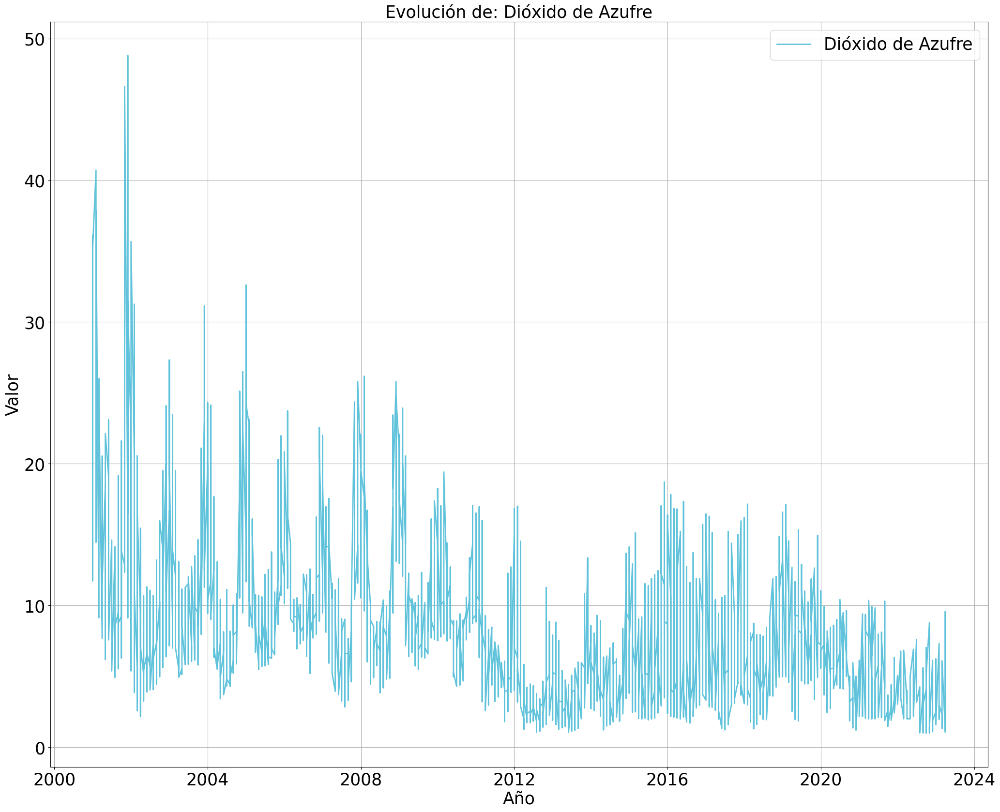

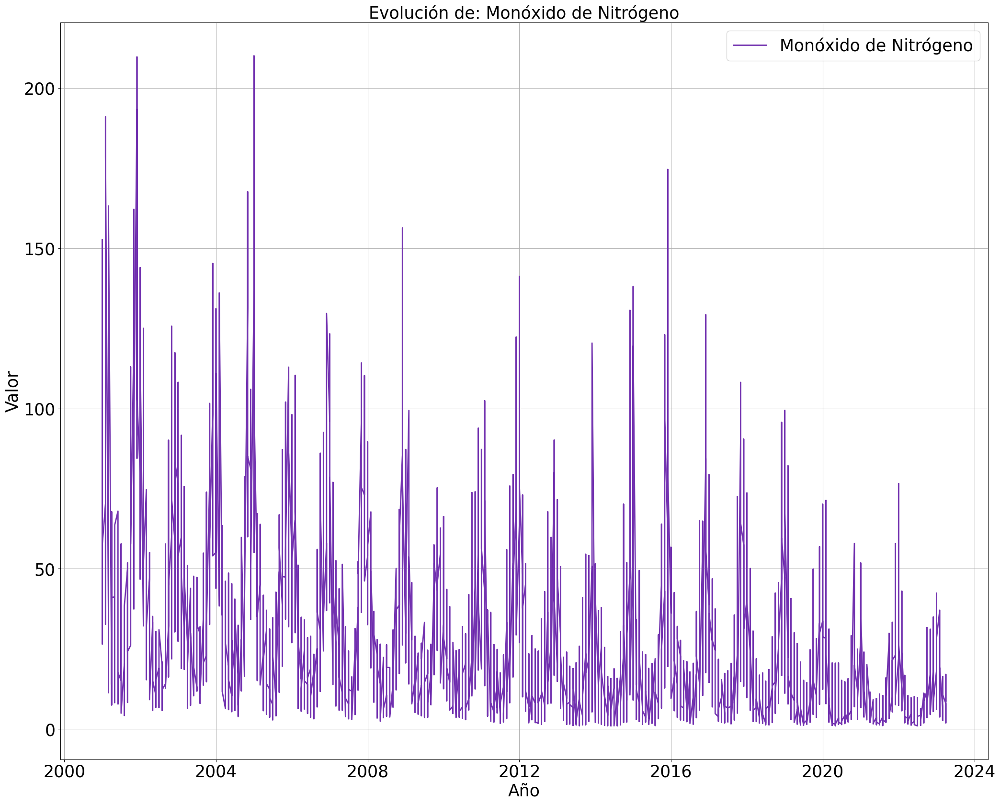

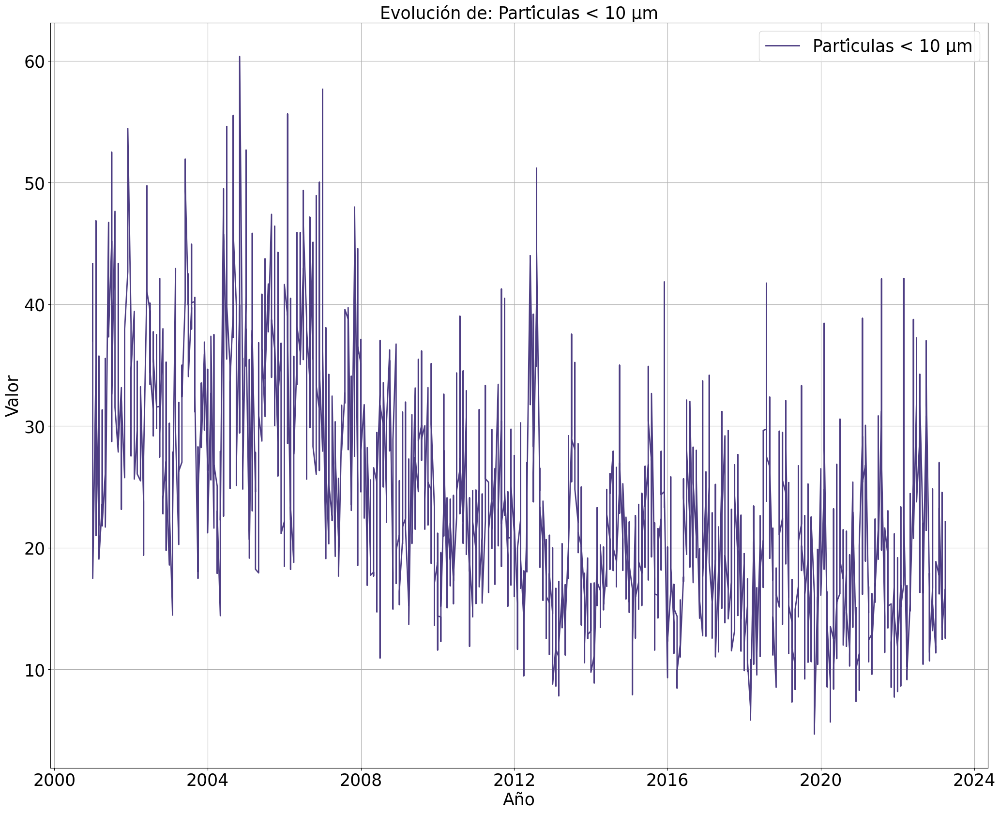

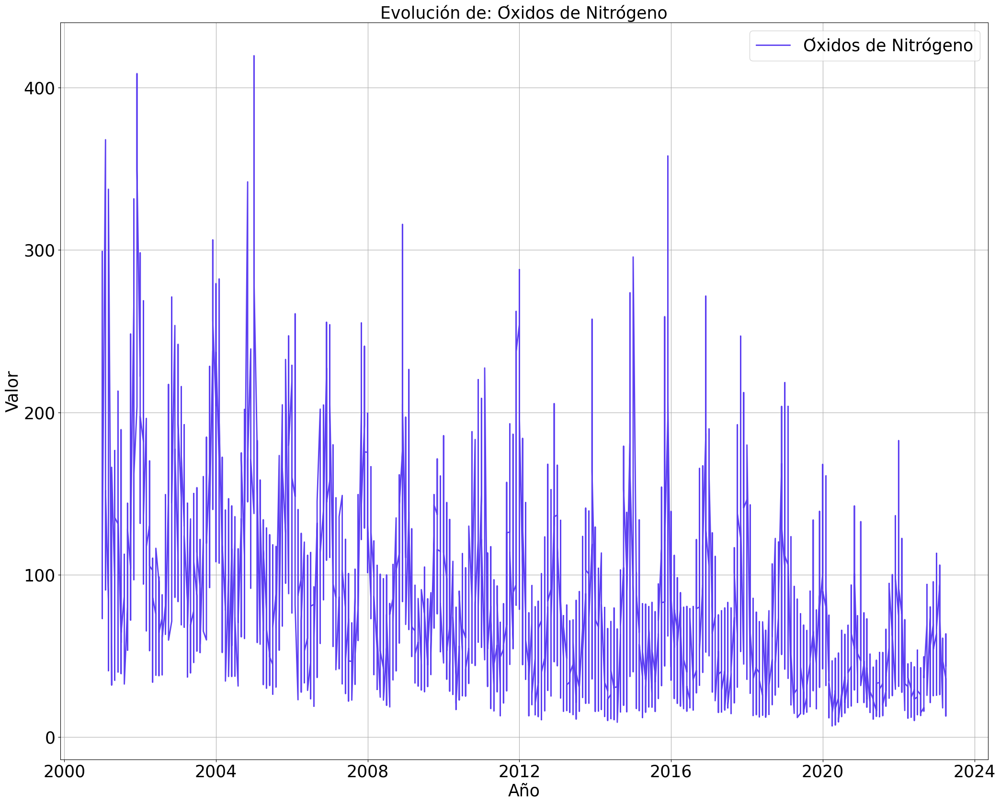

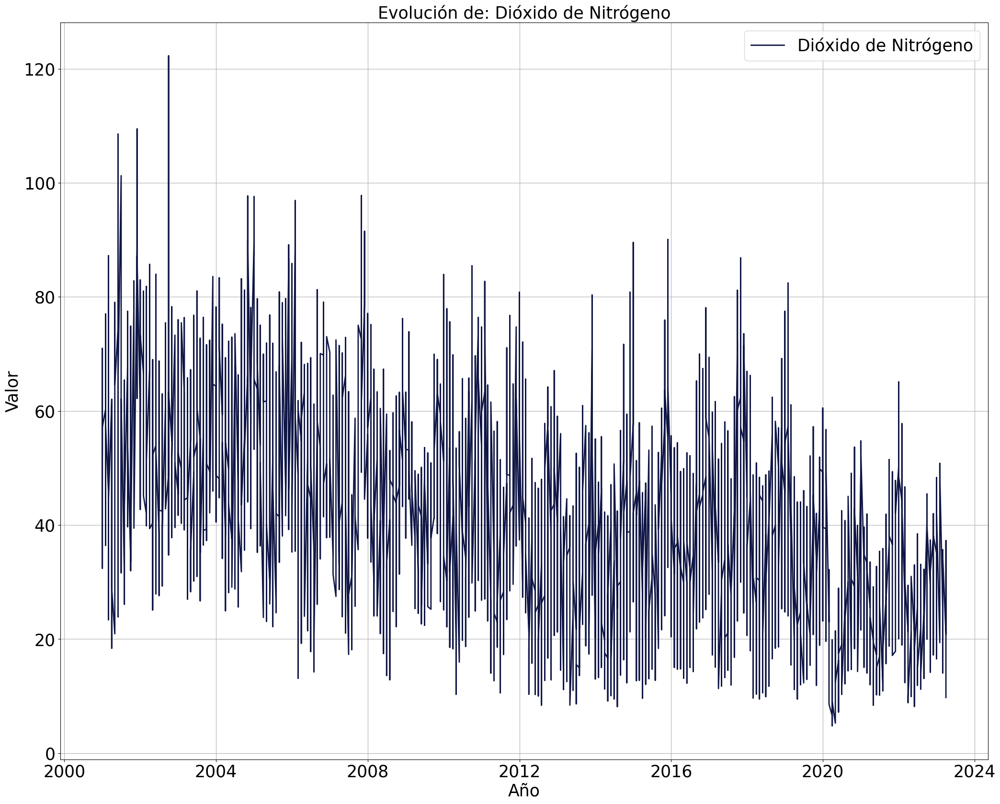

...

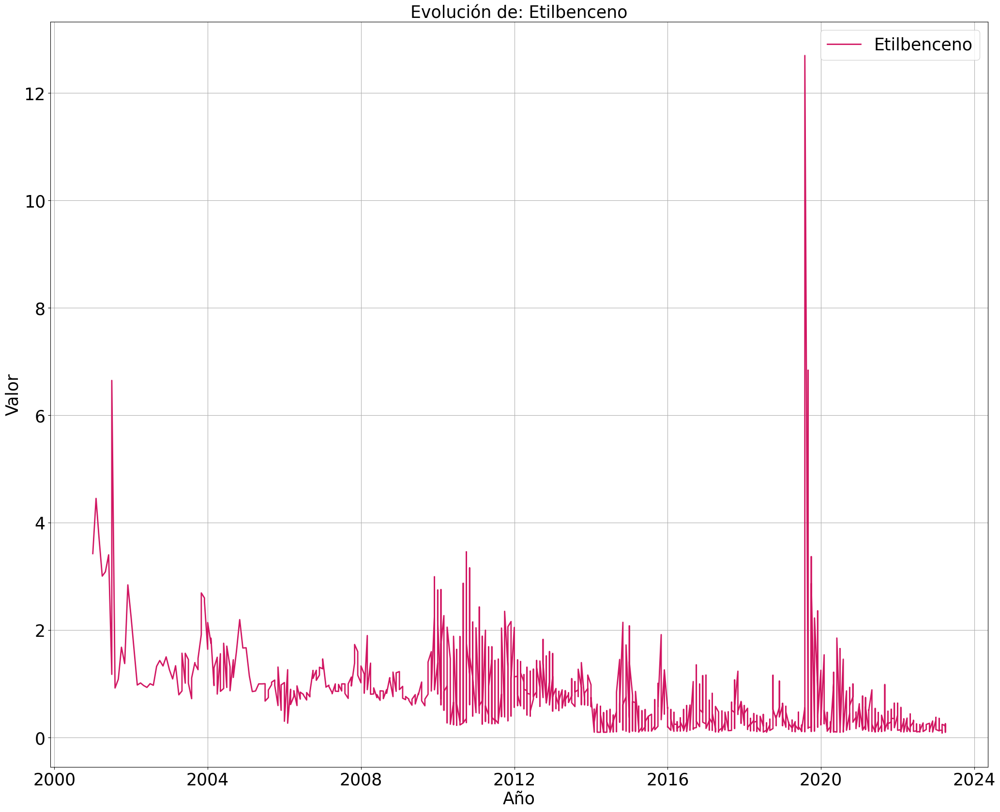

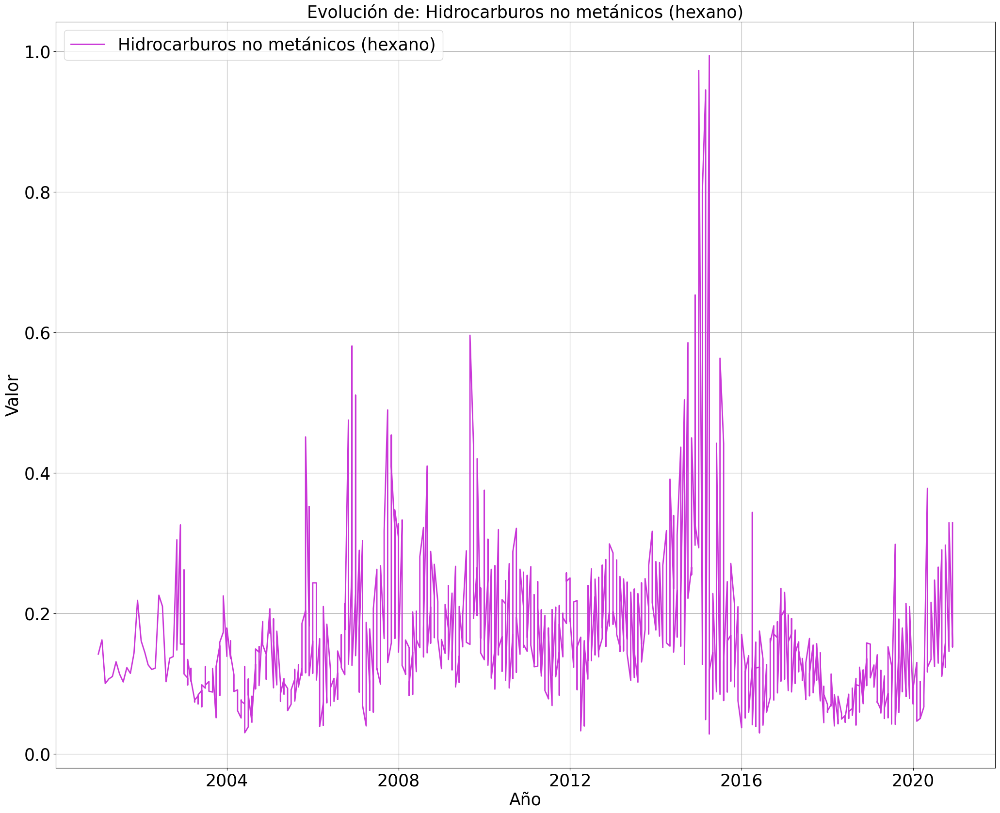

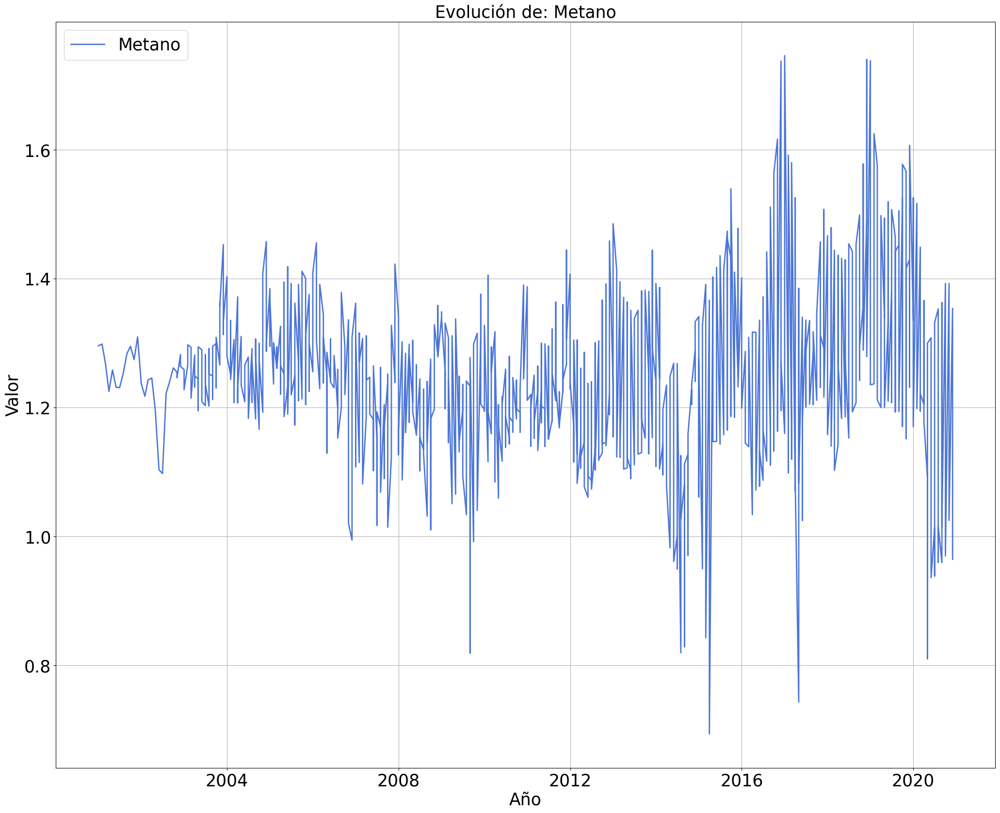

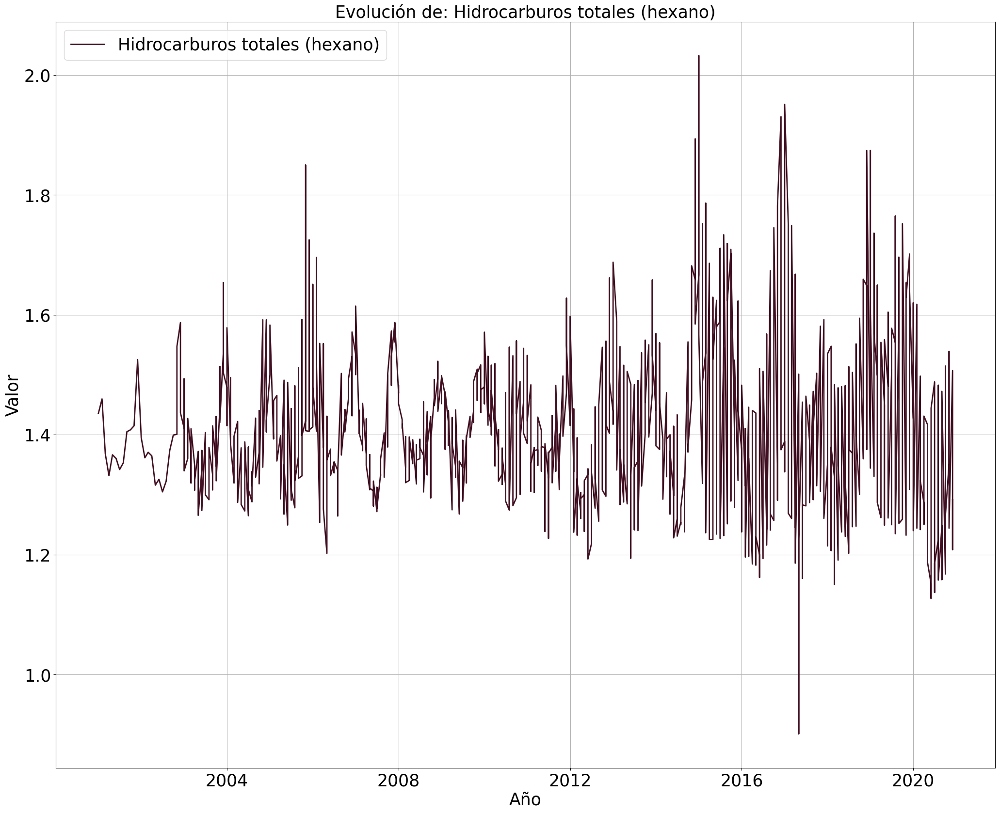

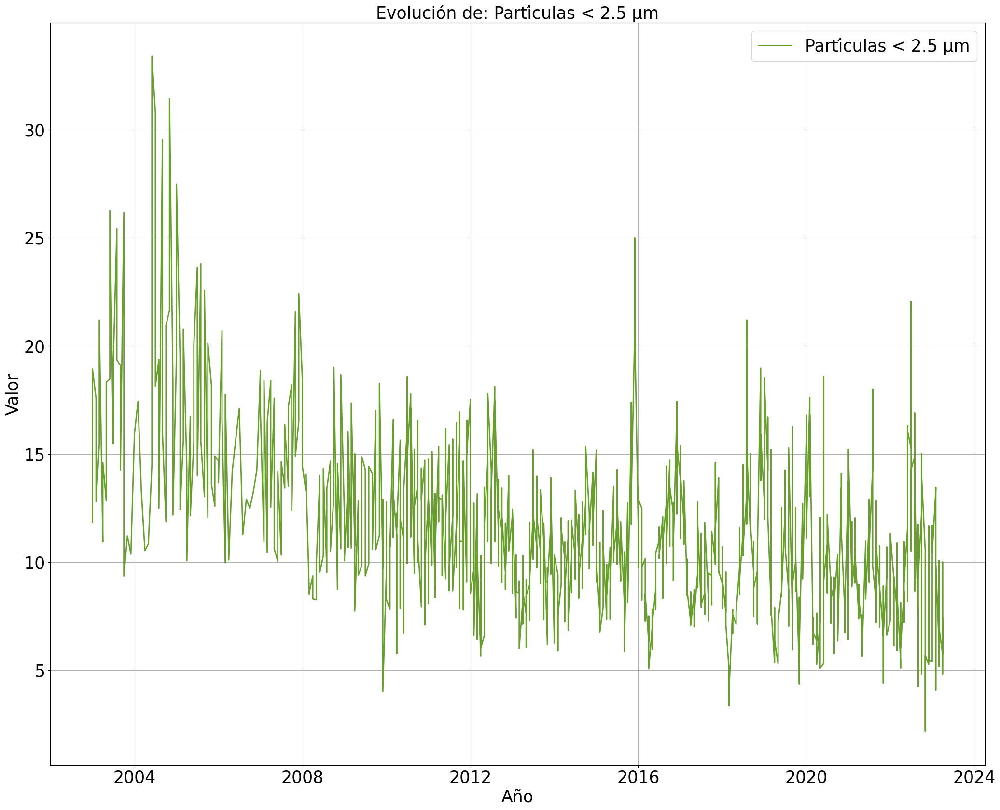

In [28]:
# Me agrupo los campos por año y mes calculando la media de cada mes (hacer el anális por día es poco eficiente)
df_final_media_mes = df_final.drop(['DIA'],axis=1).groupby(by=['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LONGITUD','LATITUD','MAGNITUD','Descripcion_Magnitud','ID_Tecnica_de_medida','Técnica_de_medida','ANO','MES'], as_index=False).mean()

# Argupo la fecha en un nuevo campo Año-Mes
df_final_media_mes['ANIO-MES'] = pd.to_datetime(df_final_media_mes['ANO'].astype(str)+'-'+df_final_media_mes['MES'].astype(str))

# Ordeno los valores de antiguos a nuevos para representarlos
df_final_media_mes.sort_values(by='ANIO-MES', inplace=True)

# Me extraigo las magnitudes que hay para después utilizarlas en el título de los grafos
lista_magnitudes = df_final_media_mes['MAGNITUD'].unique()
display(df_final_media_mes)
# Creo un gráfico por cada magnitud
for i in lista_magnitudes:
# Creo los conjuntos de datos
    y_data = df_final_media_mes['VALOR'].loc[df_final_media_mes['MAGNITUD']==i]
    x_data = df_final_media_mes['ANIO-MES'].loc[df_final_media_mes['MAGNITUD']==i]

# Creo la figura
    fig,axis = plt.subplots(1,1)
    descripcion_magnitud = df_magnitudes.loc[i,'Descripcion_Magnitud']
    axis.plot(x_data, y_data, label=descripcion_magnitud, linewidth=2, c=(np.random.rand(),np.random.rand(),np.random.rand()))
    axis.set_title('Evolución de: '+descripcion_magnitud, fontsize=25)
    axis.set_xlabel('Año', fontsize=25)
    axis.set_ylabel('Valor', fontsize=25)
    axis.legend(fontsize=25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    fig.set_figwidth(25)
    fig.set_figheight(20)
    plt.grid()
    plt.show()

Viendo los gráficos anteriores podemos extraer las siguientes conclusiones:

- Todas las medidas tienen una tendencia estacionaria, es decir, tiene ciclos dentro de un mismo año en función de la época que sea (verano, invierno...) y se va repitiendo a lo largo de los años (esto no quita que en general aumente o disminuye cada año, simplemente es una observación dentro de cada año que mostraremos más adelante)
- Aproximadamente entre 2006 y 2007 se produjo un incremento en muchas de las magnitudes
- Generalmente en los últimos dos años se han disminuído varias magnitudes (Metano, Etilbenceno, Benceno, Tolueno, Dióxido de Nitrógeno, öxidos de NitrógenoMonóxido de Nitrógeno, Dióxido de Azufre)

Ahora vamos a estudiar las medidas en un año (2022, por ser el año más reciente completo que tenemos):

,ID_ESTACION,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,MAGNITUD,Descripcion_Magnitud,ID_Tecnica_de_medida,Técnica_de_medida,ANO,MES,DIA,VALOR,DATE
15603,35,Plaza del Carmen,Urbana fondo,-3.703166,40.419209,12,Óxidos de Nitrógeno,8,Quimioluminiscencia,2022,1,01,152.0,2022-01-01
10278,18,Farolillo,Urbana fondo,-3.731836,40.394782,8,Dióxido de Nitrógeno,8,Quimioluminiscencia,2022,1,01,47.0,2022-01-01
28791,55,Urb. Embajada,Urbana fondo,-3.580565,40.462363,30,Benceno,59,Cromatografía de gases,2022,1,01,0.6,2022-01-01
28779,38,Cuatro Caminos,Urbana tráfico,-3.707130,40.445544,30,Benceno,59,Cromatografía de gases,2022,1,01,0.9,2022-01-01
28767,24,Casa de Campo,Suburbana,-3.747345,40.419358,30,Benceno,59,Cromatografía de gases,2022,1,01,1.0,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018932,38,Cuatro Caminos,Urbana tráfico,-3.707130,40.445544,9,Partículas < 2.5 μm,47,Microbalanza,2022,12,31,12.0,2022-12-31
1018944,47,Méndez Álvaro,Urbana fondo,-3.686814,40.398099,9,Partículas < 2.5 μm,47,Microbalanza,2022,12,31,12.0,2022-12-31
1018956,48,Castellana,Urbana tráfico,-3.690373,40.439890,9,Partículas < 2.5 μm,47,Microbalanza,2022,12,31,14.0,2022-12-31
1018980,56,Plaza Elíptica,Urbana tráfico,-3.718768,40.385034,9,Partículas < 2.5 μm,47,Microbalanza,2022,12,31,14.0,2022-12-31


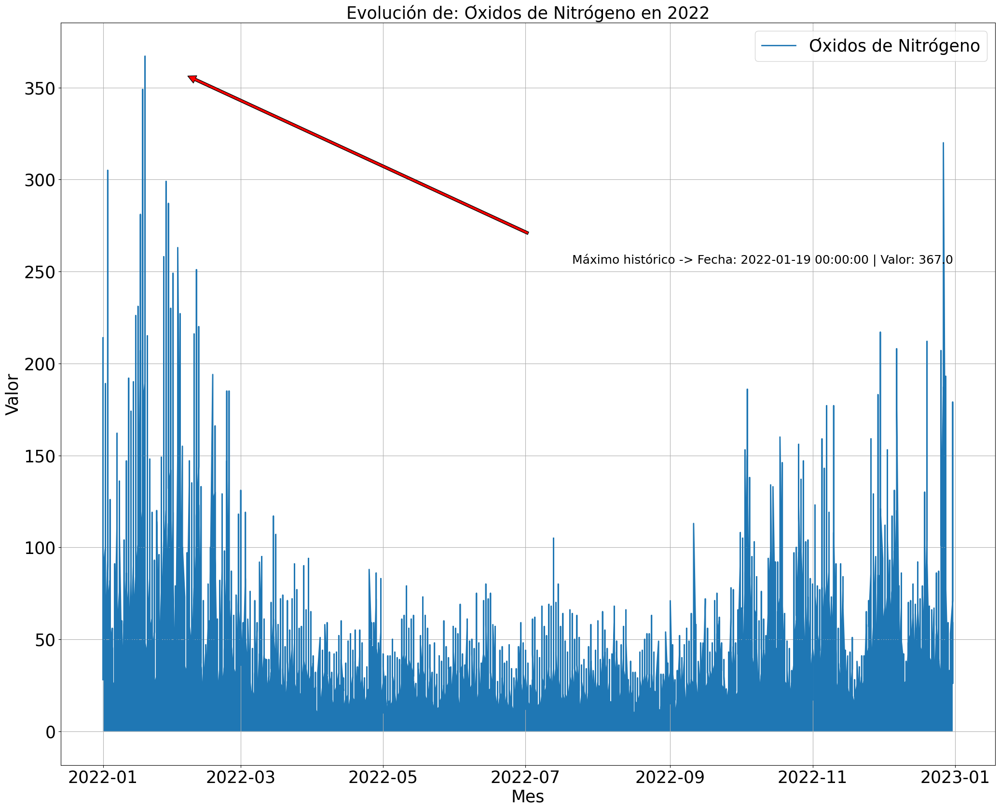

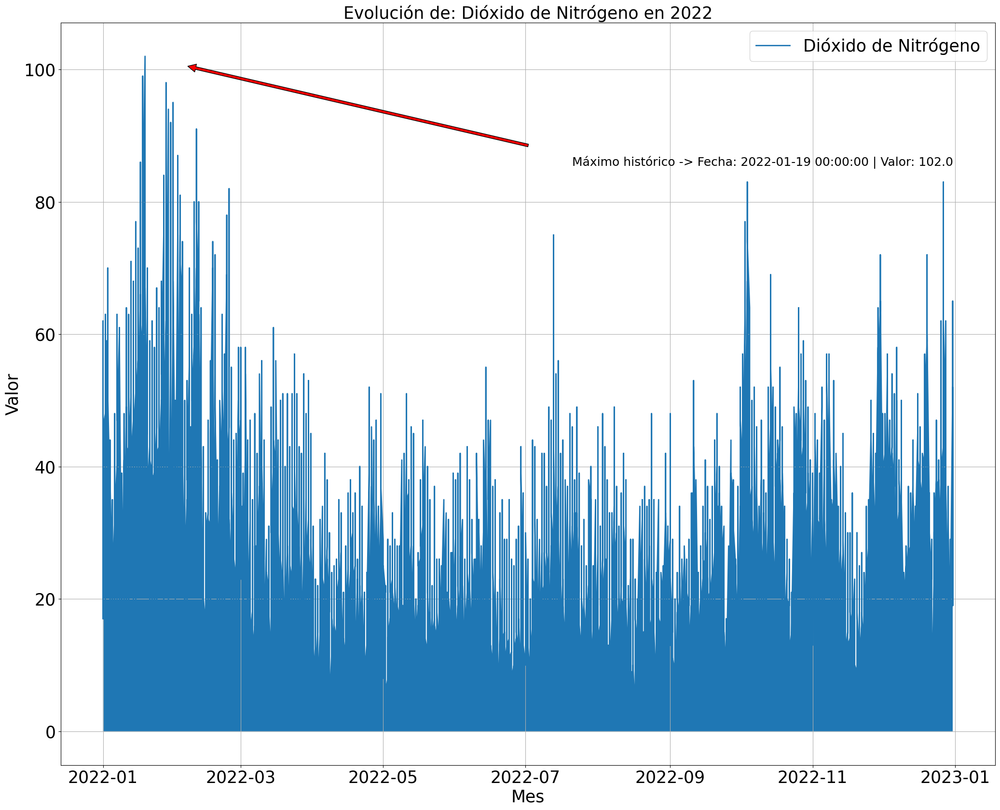

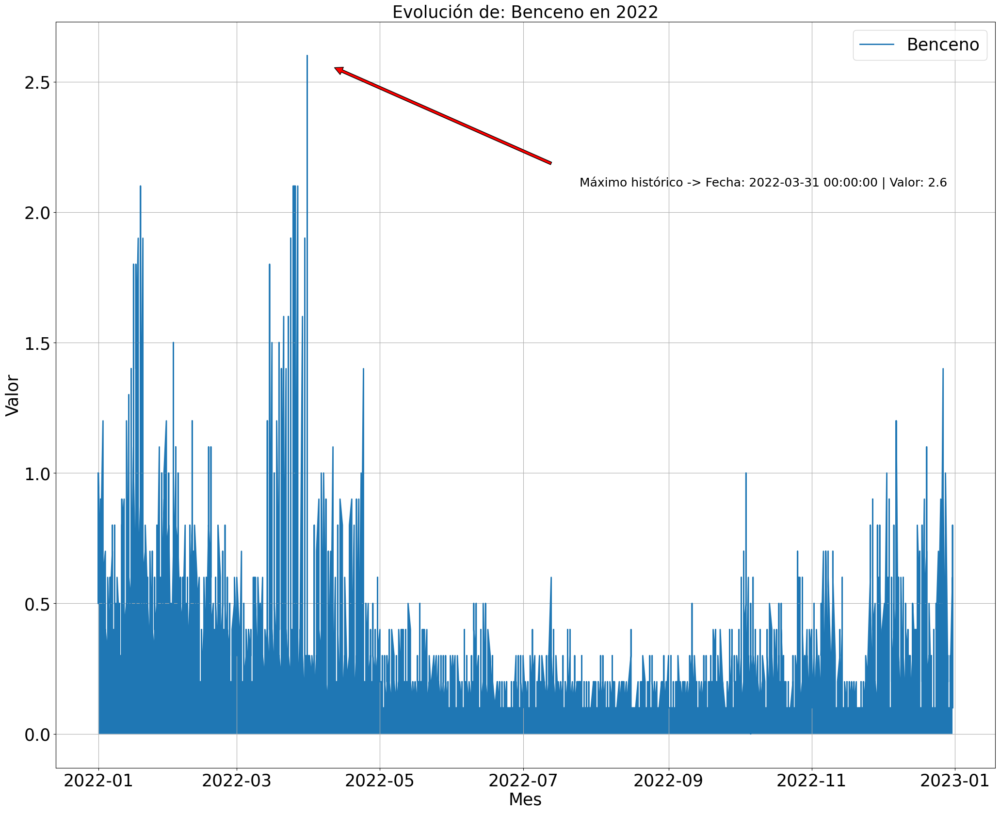

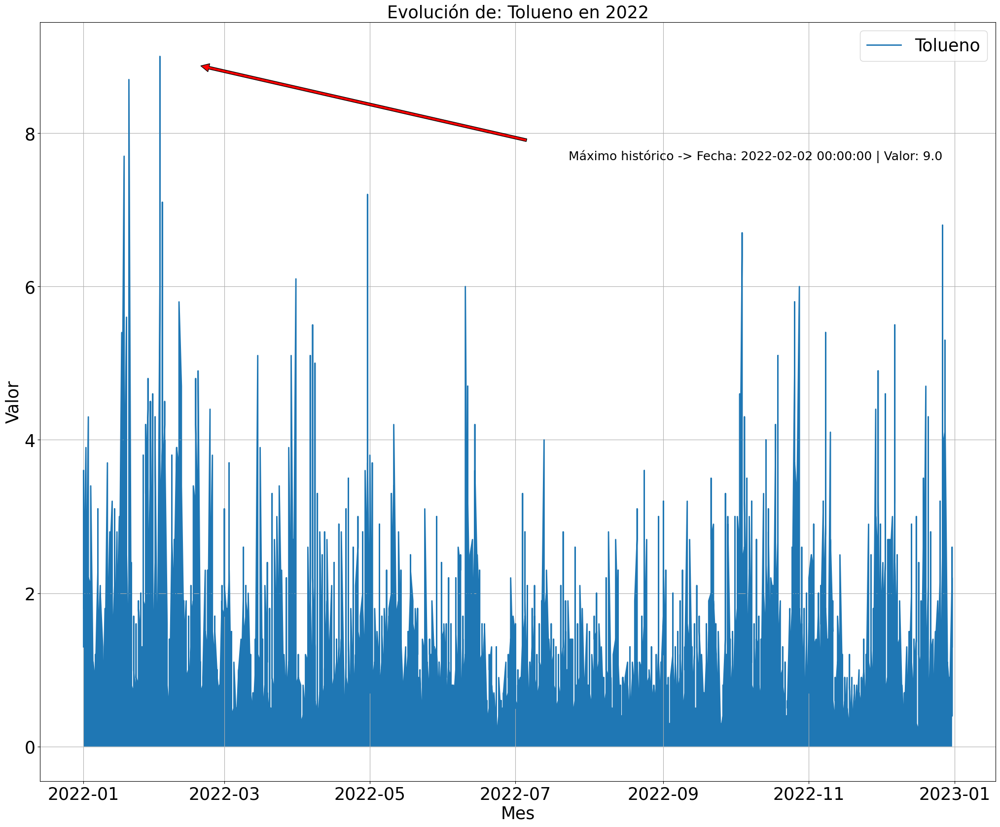

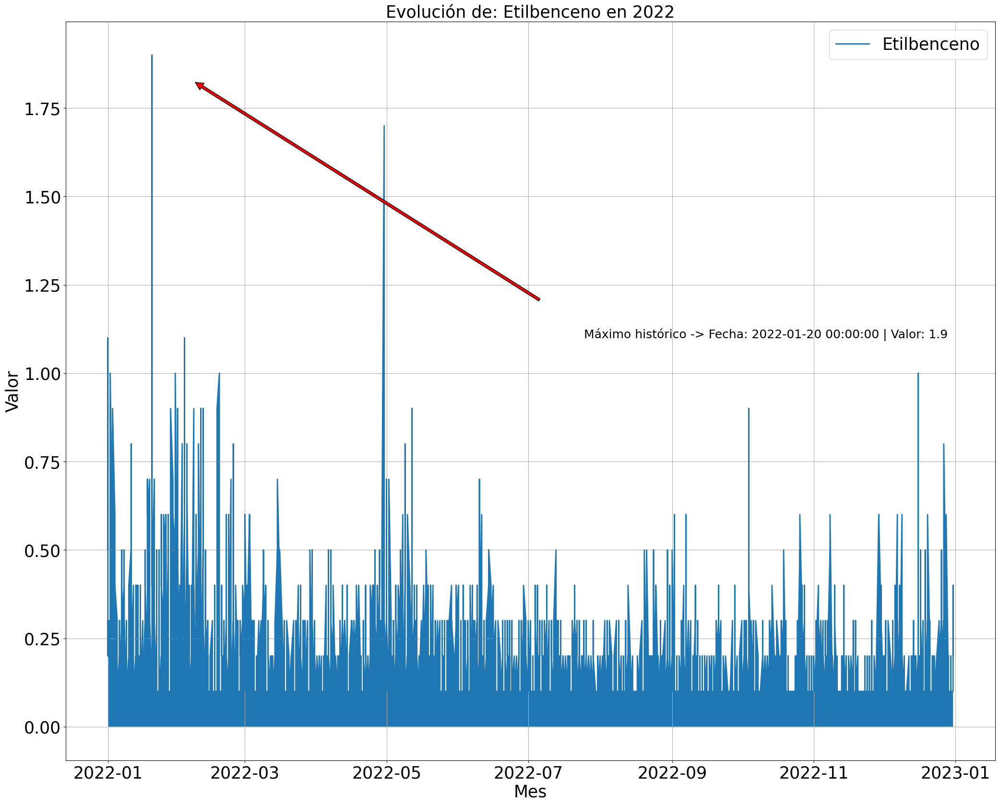

...

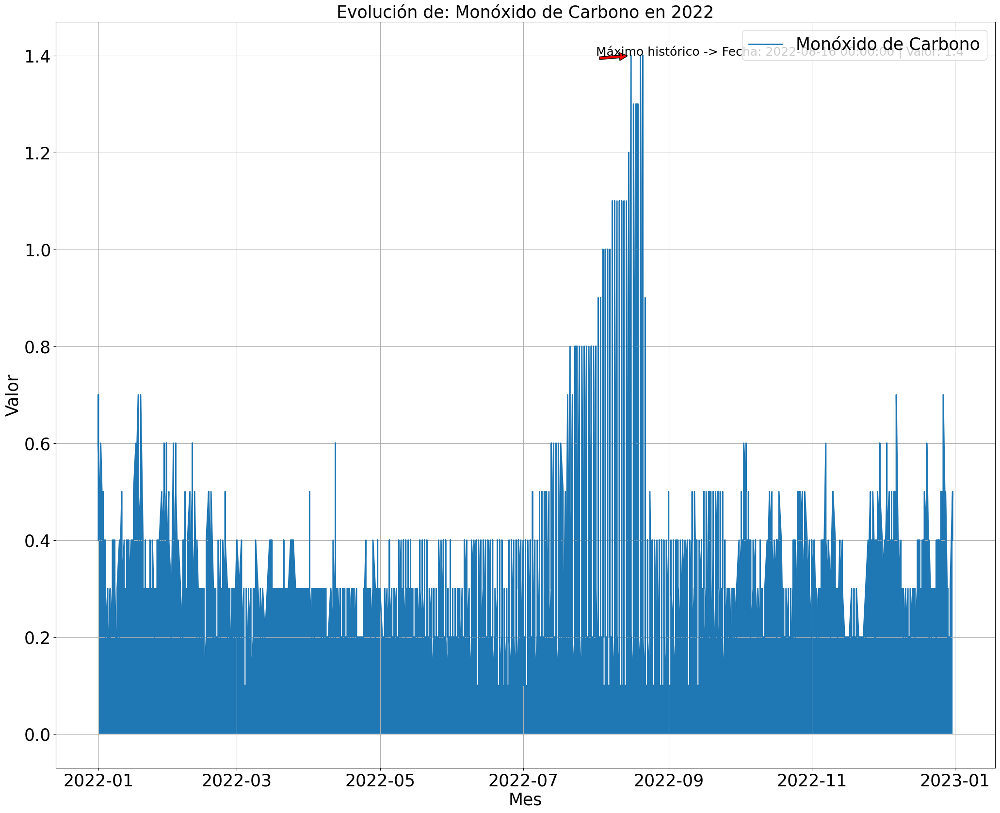

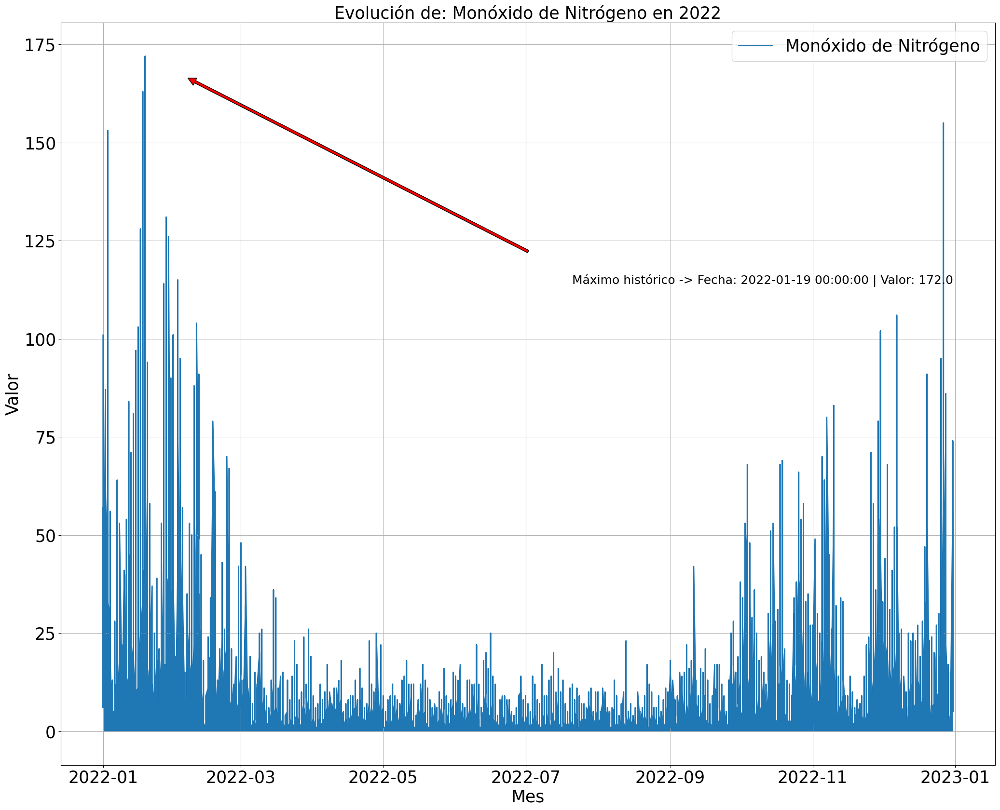

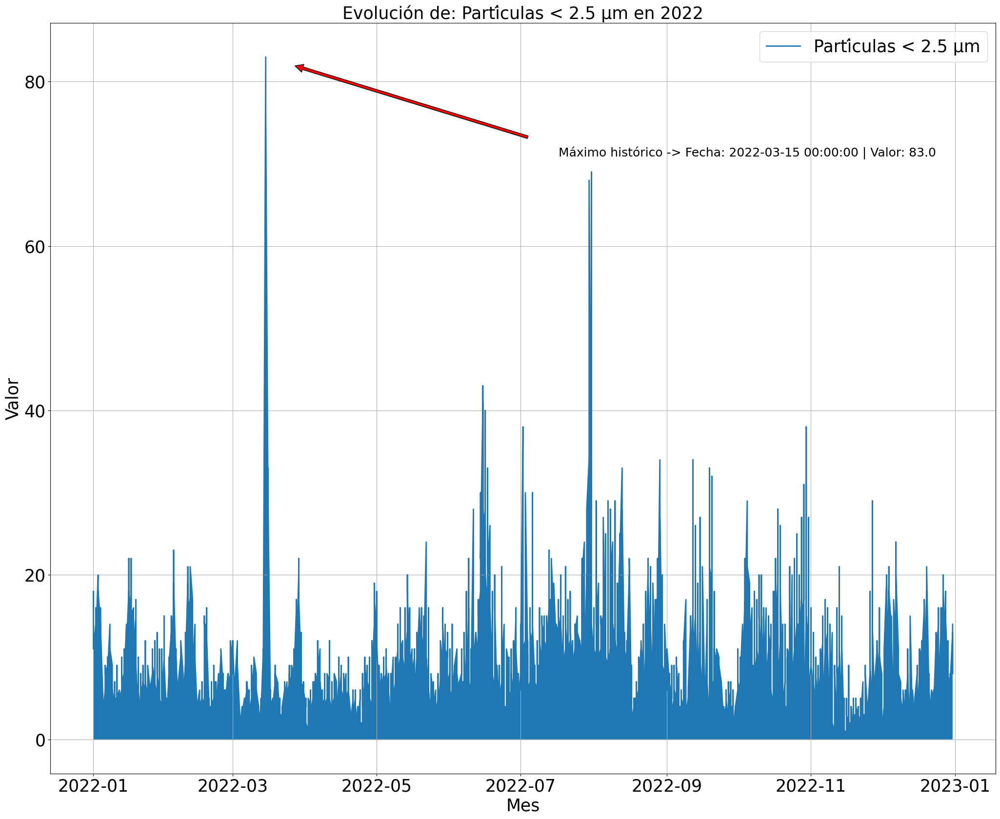

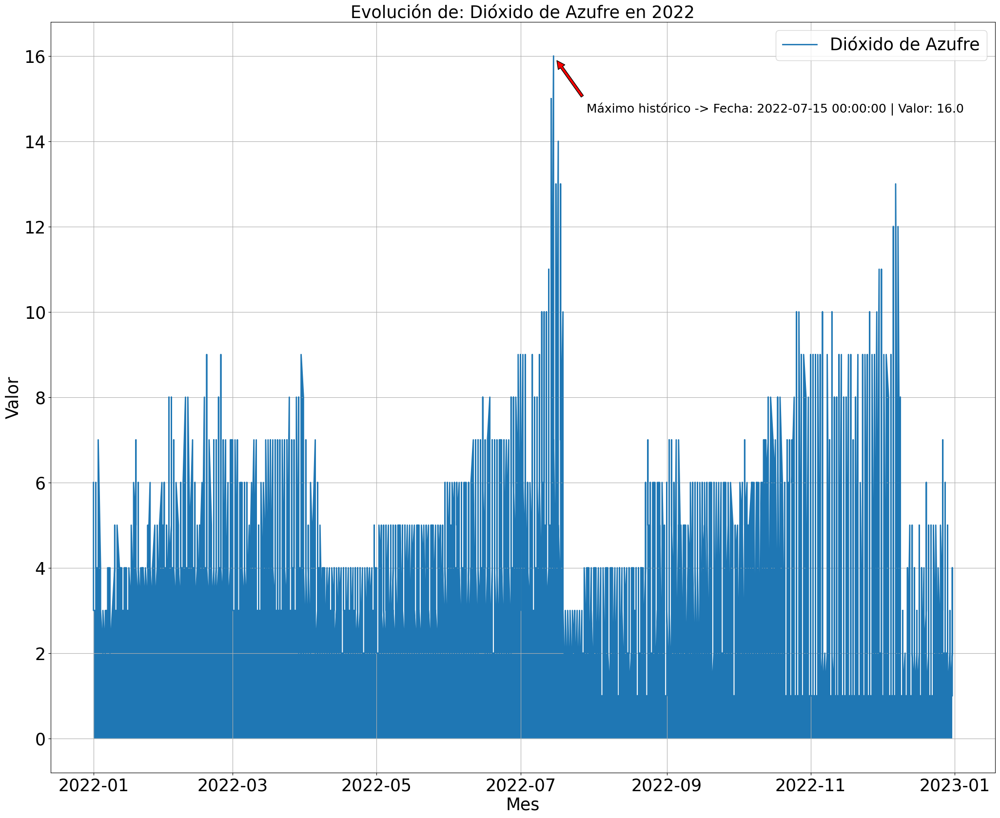

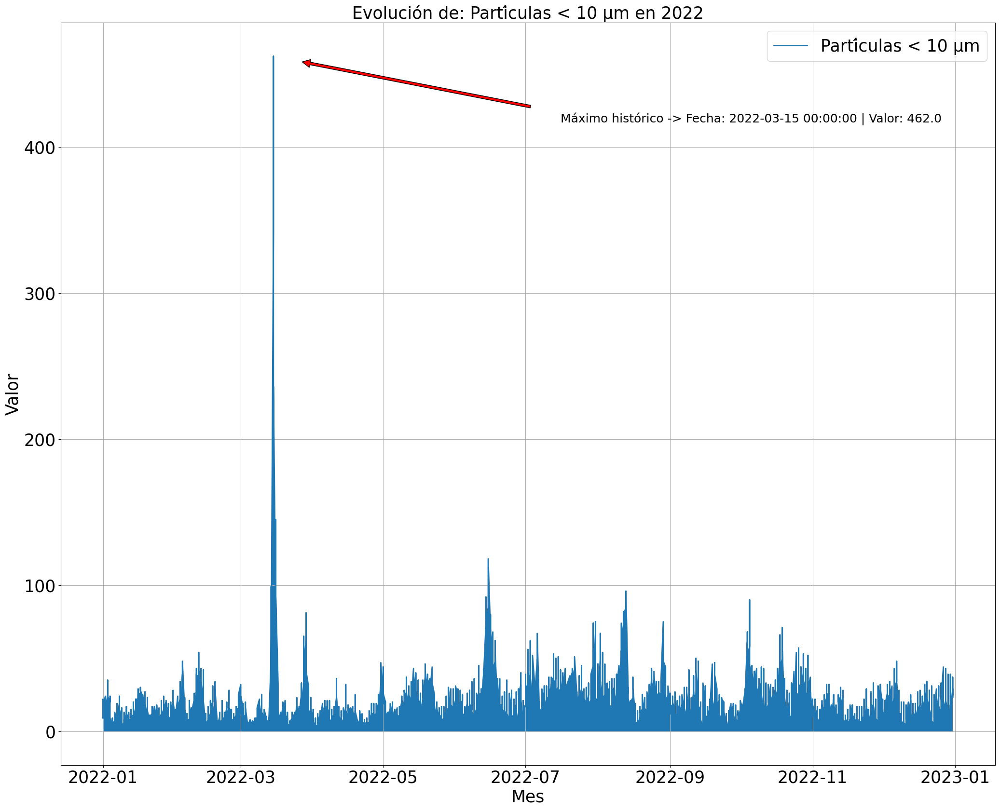

In [29]:
# Argupo la fecha en un nuevo campo Año-Mes-Dia
df_final['DATE'] = pd.to_datetime(df_final['ANO'].astype(str)+'-'+df_final['MES'].astype(str)+'-'+df_final['DIA'].astype(str))

# Ordeno los valores de antiguos a nuevos y me quedo con 2022 para representarlos
df_final_media_2022 = df_final.loc[df_final['ANO']==2022].sort_values(by='DATE')

# Me extraigo las magnitudes que hay para después utilizarlas en el título de los grafos
lista_magnitudes = df_final_media_2022['MAGNITUD'].unique()
display(df_final_media_2022)
# Creo un gráfico por cada magnitud
for i in lista_magnitudes:
# Defino los valores máximos para mostrar con flecha
    df_magnitudes_i = df_final_media_2022.loc[df_final_media_2022['MAGNITUD']==i]
    df_max = df_magnitudes_i[['DATE','VALOR']].loc[df_magnitudes_i['VALOR']==df_magnitudes_i['VALOR'].max()]
    y_data_max = df_max['VALOR'].iloc[0]
    x_data_max = df_max['DATE'].iloc[0]

# Defino los conjuntos de datos
    y_data = df_final_media_2022['VALOR'].loc[df_final_media_2022['MAGNITUD']==i]
    x_data = df_final_media_2022['DATE'].loc[df_final_media_2022['MAGNITUD']==i]

# Creo la figura
    fig,axis = plt.subplots(1,1)
    descripcion_magnitud = df_magnitudes.loc[i,'Descripcion_Magnitud']
    axis.plot(x_data, y_data, label=descripcion_magnitud, linewidth=2)
    texto = 'Máximo histórico -> Fecha: '+str(x_data_max)+' | Valor: '+str(y_data_max)
    axis.annotate(texto,xy=(x_data_max,y_data_max),fontsize=18,xytext=(x_data.quantile(0.55),(y_data.quantile(0.999))),arrowprops = dict(facecolor='red', shrink=0.1))
    axis.legend(loc='best', fontsize=25)
    axis.fill_between(x_data, y_data)
    axis.set_title('Evolución de: '+descripcion_magnitud+' en 2022', fontsize=25)
    axis.set_xlabel('Mes', fontsize=25)
    axis.set_ylabel('Valor', fontsize=25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    fig.set_figwidth(25)
    fig.set_figheight(20)
    plt.grid()
    plt.show()

En la gráfica del año 2022 podemos ver ciertos datos interesantes:

- El Ozono, el Monóxido de Carbono aumentan sensiblemente durante los meses de juio y agosto, el verano, que es cuando menos gente está en Madrid, menos gente circula en coche y, por tanto, hay menos contaminación en la ciudad y mejor calidad del aire.
- El Monóxido de Nitrógeno, el Óxidos de Nitrógeno y el Dióxido de Nitrógeno aumentan en los meses fríos (de octubre a marzo), por lo que podemos deducir que va asociado al uso de la calefacción para calentarnos.
- En la medición del Dióxido de Azufre observamos una gran caída en el mes de agosto que no sigue la tendencia. Ante eso podemos plantear 2 hipótesis: o bien hubo un problema en el aparato de medida y empezó a medir mal (muy descartable, porque ahí se muestra la media de las medidas de todos los aparatos de medida, por lo que tendrían que estar todas rotas) o bien hubo un "evento" ambiental (natural o artificial) que produjo dicha bajada.


Una vez tenemos una vista general de las medidas, vamos a hacer un estudio sobre los tipos de estaciones, que recuerdo que pueden ser Úrbana de tráfico, Úrbana de fondo y Suburbana.

,NOM_TIPO,MAGNITUD,Descripcion_Magnitud,DATE,ANO,VALOR
0,Suburbana,7,Monóxido de Nitrógeno,2022-01-01,2022,9.000000
3581,Urbana fondo,6,Monóxido de Carbono,2022-01-01,2022,0.700000
6848,Urbana fondo,35,Etilbenceno,2022-01-01,2022,0.500000
1450,Suburbana,12,Óxidos de Nitrógeno,2022-01-01,2022,38.000000
10495,Urbana tráfico,30,Benceno,2022-01-01,2022,0.800000
...,...,...,...,...,...,...
3580,Urbana fondo,1,Dióxido de Azufre,2022-12-31,2022,4.000000
3929,Urbana fondo,6,Monóxido de Carbono,2022-12-31,2022,0.400000
8669,Urbana tráfico,8,Dióxido de Nitrógeno,2022-12-31,2022,48.666667
2530,Suburbana,20,Tolueno,2022-12-31,2022,2.200000


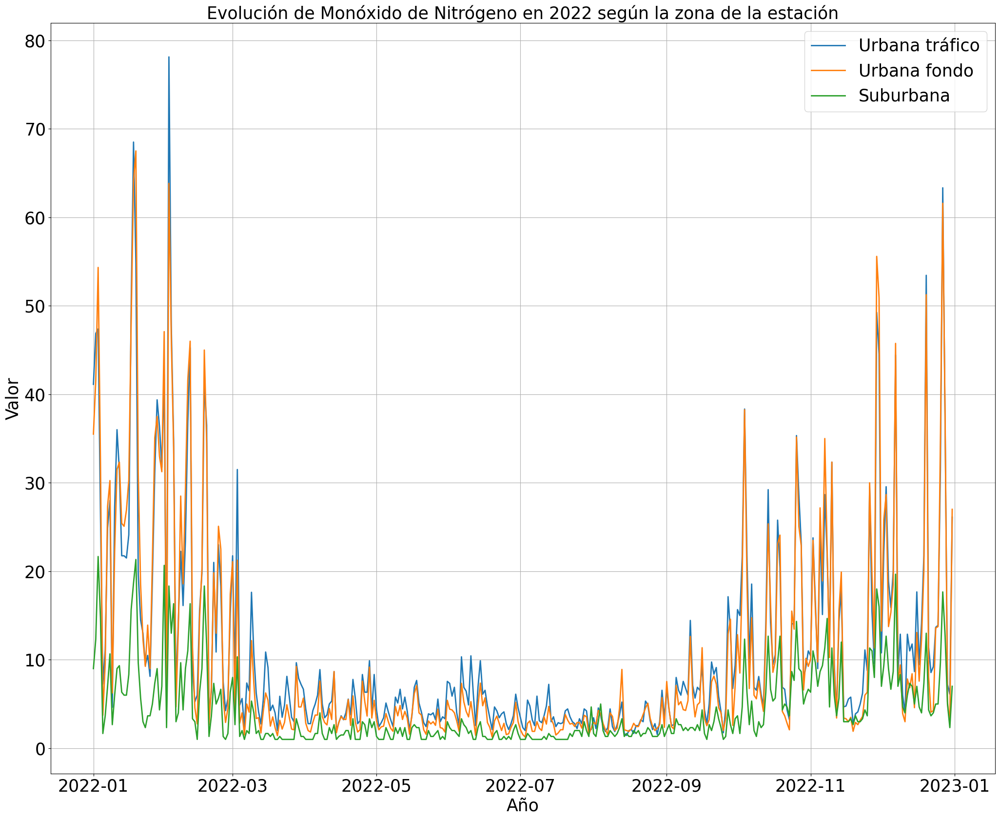

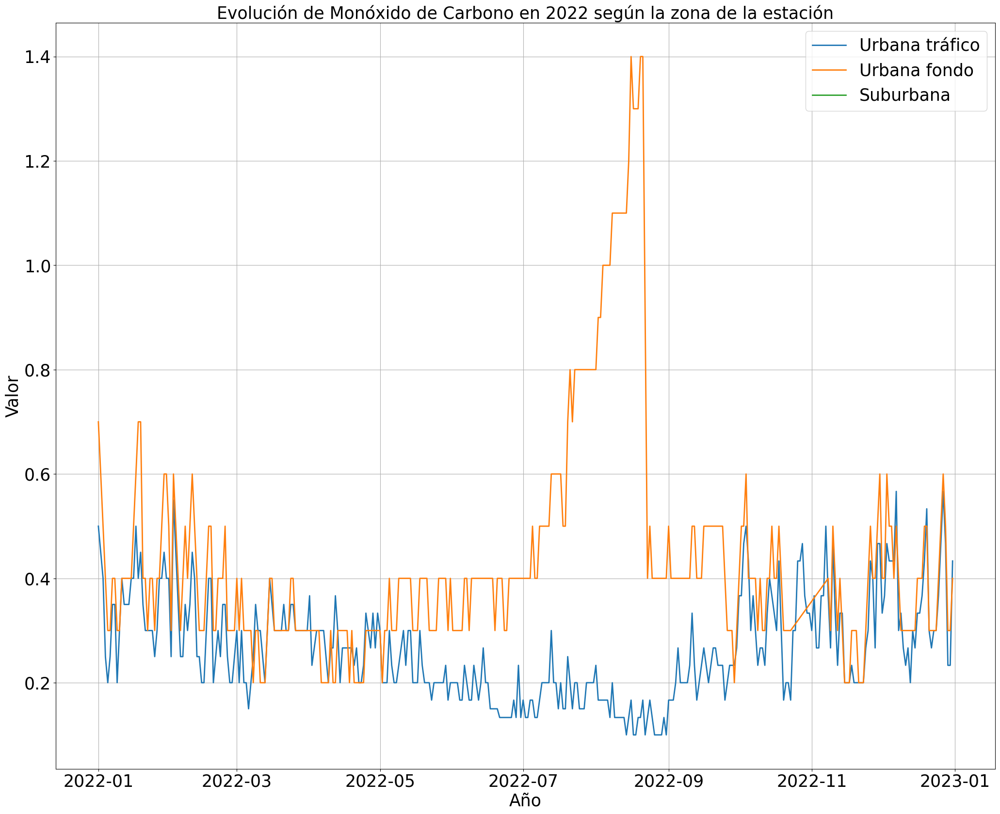

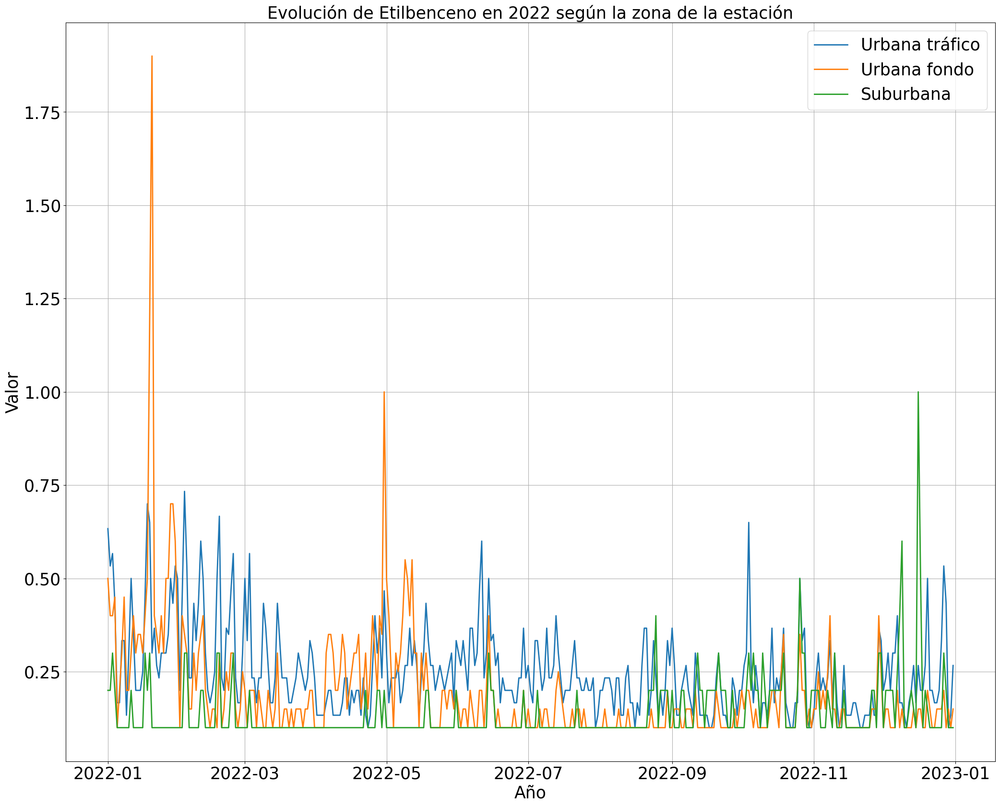

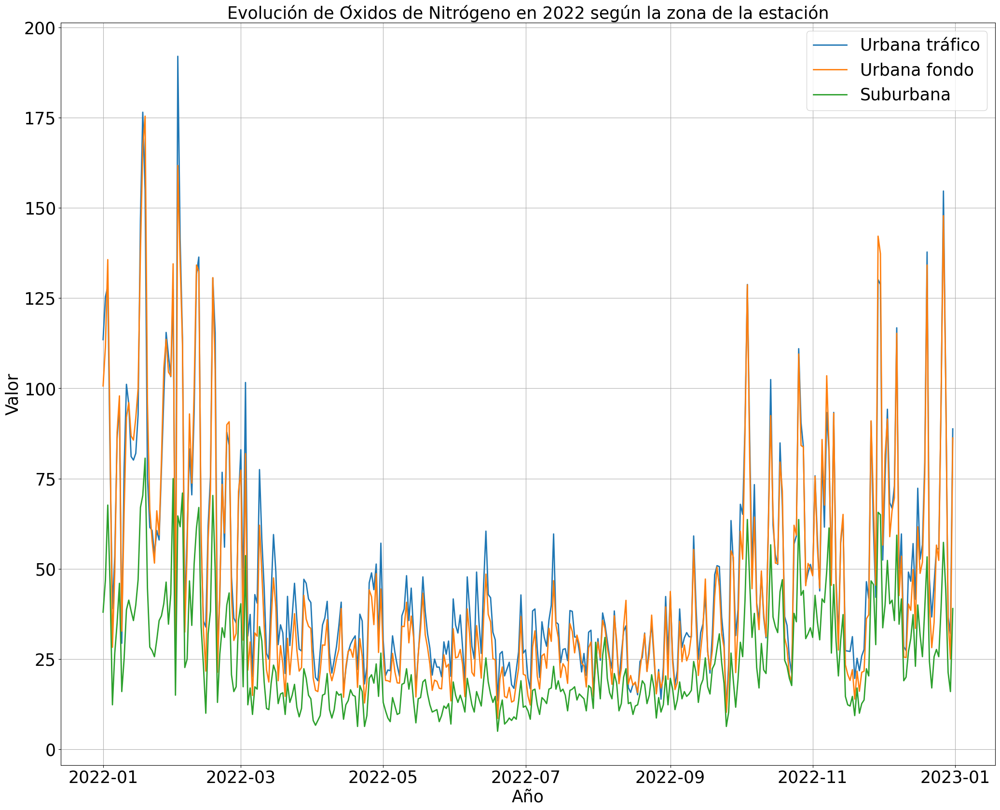

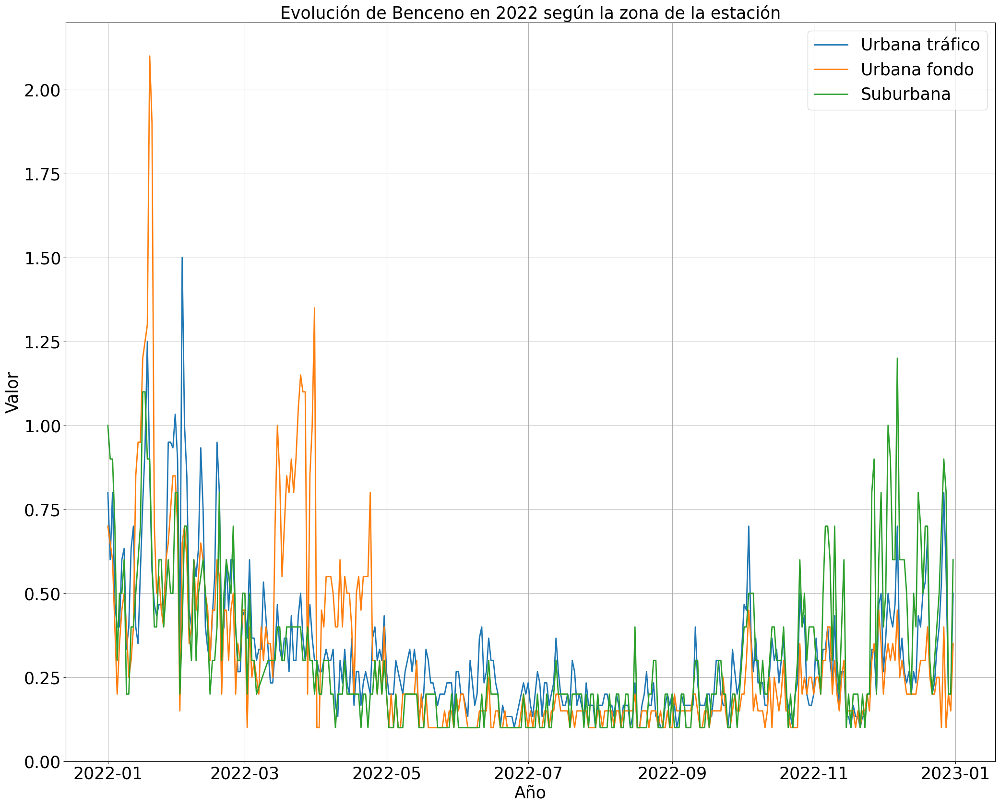

...

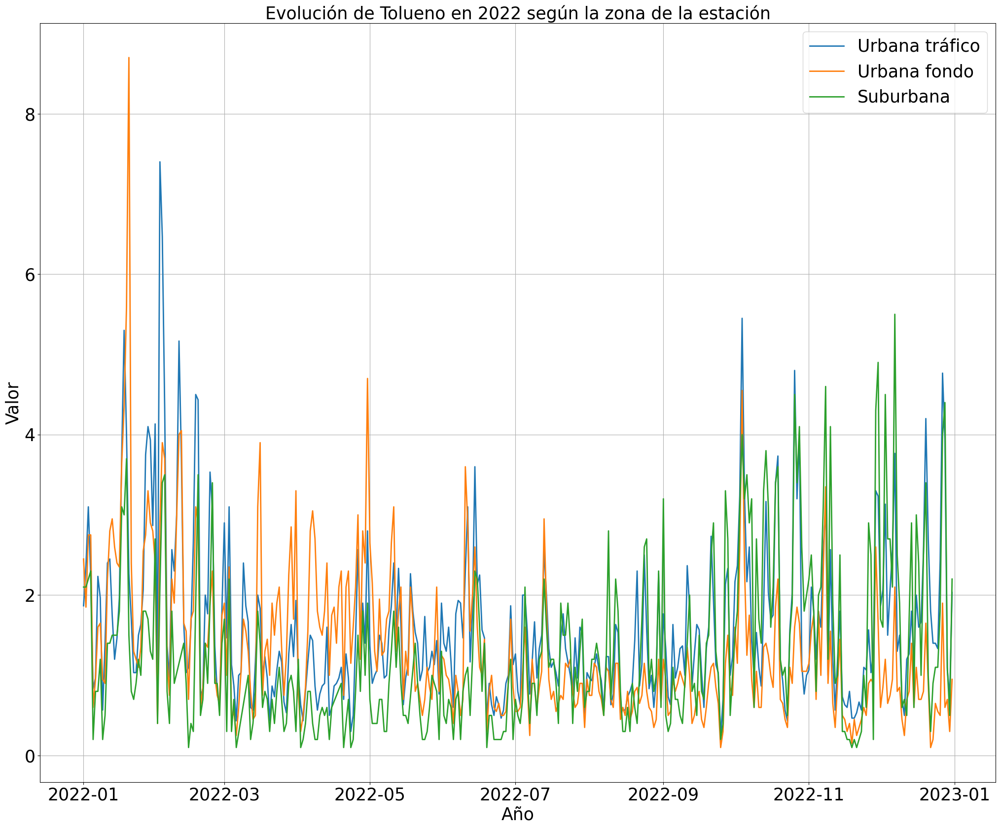

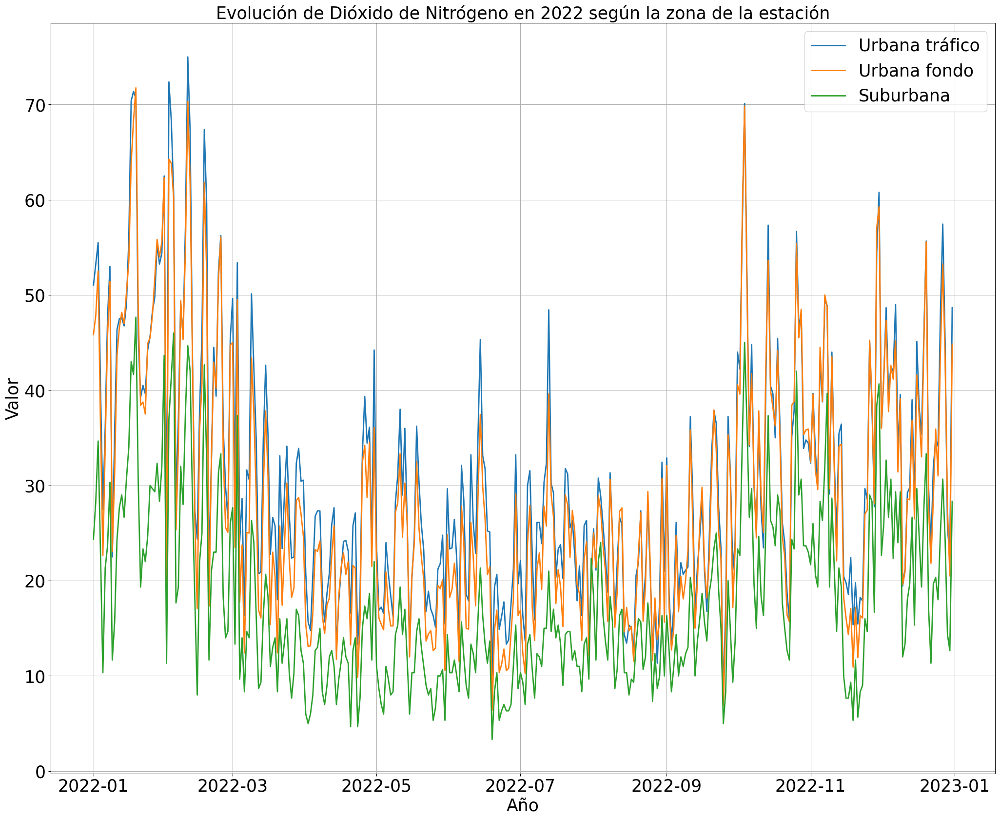

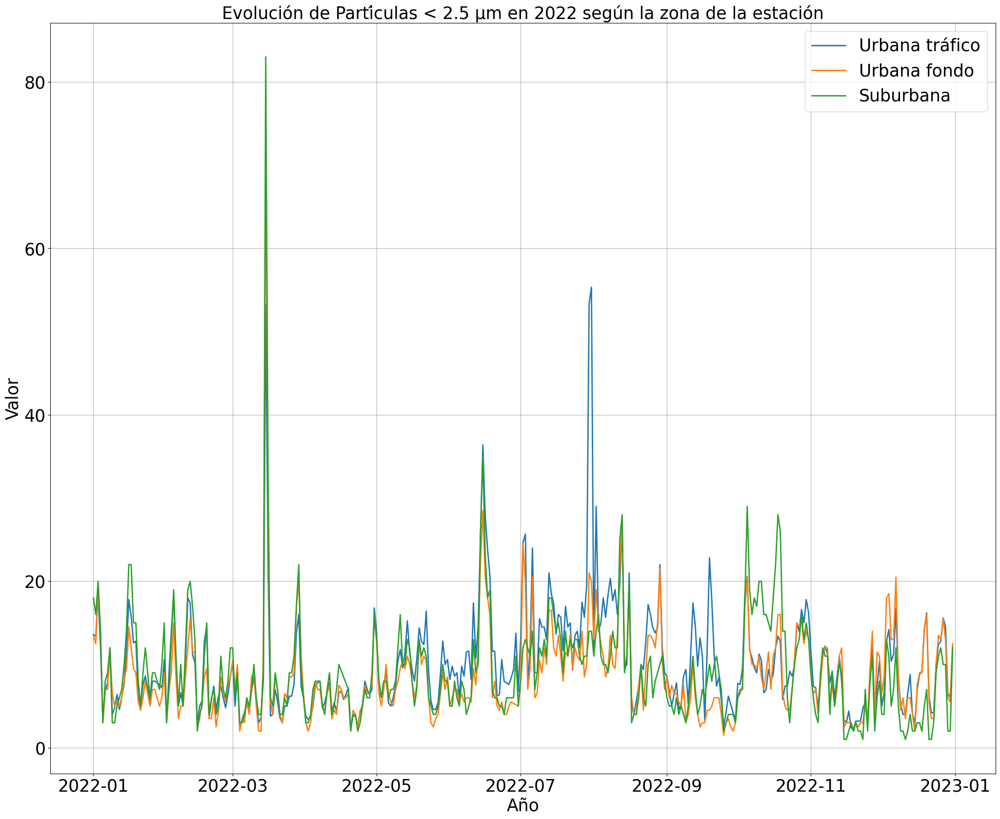

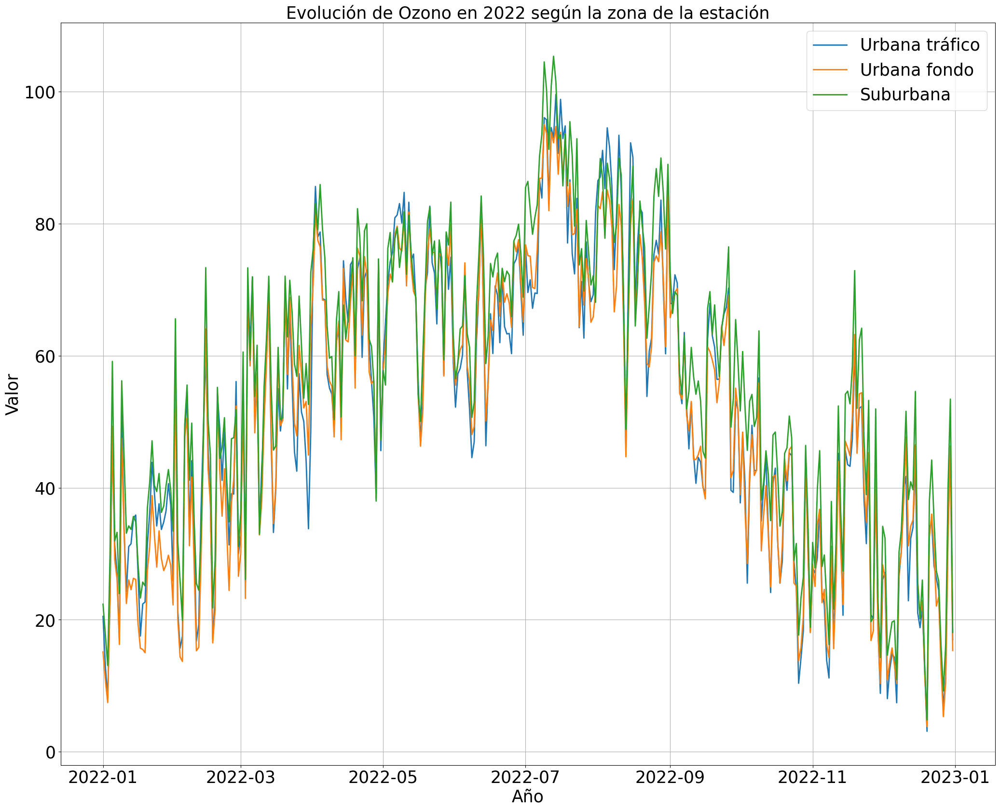

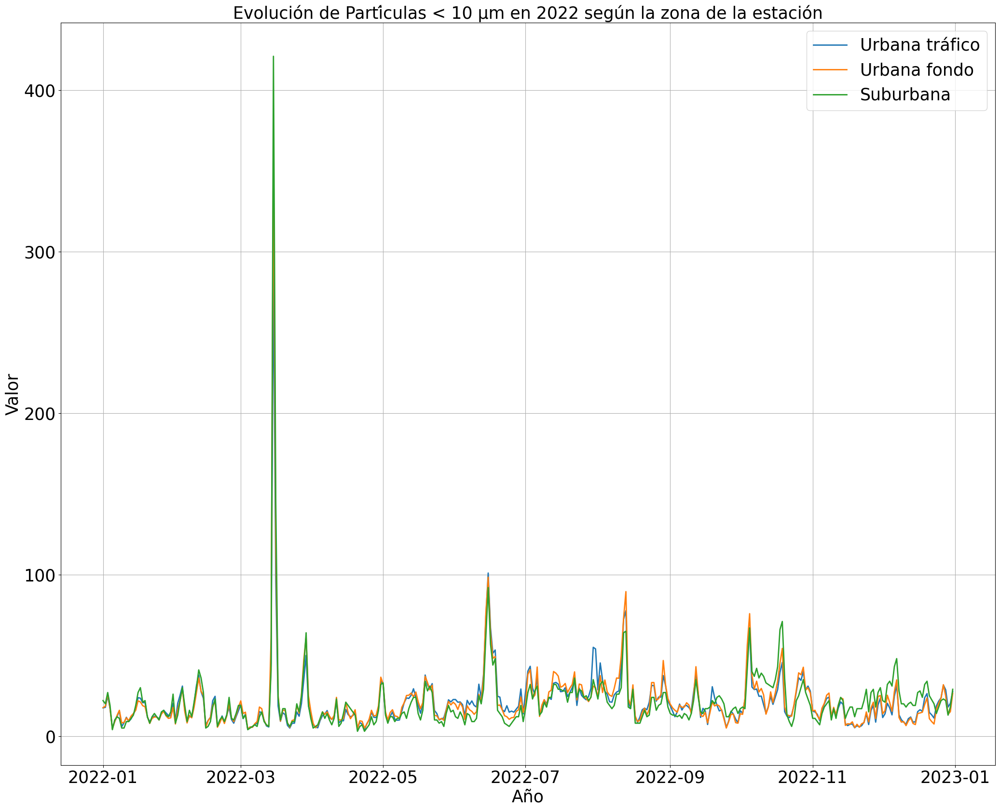

In [30]:
# Hacemos un evolutivo en el año 2022 por magnitud y mostrando en el mismo gráfico 3 evolutivos en función de la estación
# Elimino algunas columnas, agrupo los valores por el tipo de estación, ordeno los valores de antiguos a nuevos y me quedo con 2022 para representarlos
df_final_media_2022_por_estacion = df_final.drop(['ID_ESTACION','NOMBRE_ESTACION','LONGITUD','LATITUD','ID_Tecnica_de_medida','Técnica_de_medida','MES','DIA'],axis=1)
df_final_media_2022_por_estacion = df_final_media_2022_por_estacion.loc[df_final_media_2022_por_estacion['ANO']==2022].groupby(by=['NOM_TIPO','MAGNITUD','Descripcion_Magnitud','DATE','ANO'], as_index=False).mean().sort_values(by='DATE')

# Me extraigo las magnitudes que hay para después utilizarlas en el título de los grafos
lista_magnitudes = df_final_media_2022_por_estacion['MAGNITUD'].unique()
display(df_final_media_2022_por_estacion)
# Creo un gráfico por cada magnitud
for i in lista_magnitudes:
# Creo los conjuntos de datos (1 por cada tipo de estación)
    y_data_1 = df_final_media_2022_por_estacion['VALOR'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Urbana tráfico'))]
    y_data_2 = df_final_media_2022_por_estacion['VALOR'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Urbana fondo'))]
    y_data_3 = df_final_media_2022_por_estacion['VALOR'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Suburbana'))]
    x_data_1 = df_final_media_2022_por_estacion['DATE'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Urbana tráfico'))]
    x_data_2 = df_final_media_2022_por_estacion['DATE'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Urbana fondo'))]
    x_data_3 = df_final_media_2022_por_estacion['DATE'].loc[((df_final_media_2022_por_estacion['MAGNITUD']==i) & (df_final_media_2022_por_estacion['NOM_TIPO']=='Suburbana'))]
    
# Creo la figura
    fig,axis = plt.subplots(1,1)
    axis.plot(x_data_1, y_data_1, label='Urbana tráfico', linewidth=2)
    axis.plot(x_data_2, y_data_2, label='Urbana fondo', linewidth=2)
    axis.plot(x_data_3, y_data_3, label='Suburbana',linewidth=2)
    axis.legend(loc='best', fontsize=25)
    descripcion_magnitud = df_magnitudes.loc[i,'Descripcion_Magnitud']
    axis.set_title('Evolución de '+descripcion_magnitud+' en 2022 según la zona de la estación', fontsize=25)
    axis.set_xlabel('Año',fontsize=25)
    axis.set_ylabel('Valor',fontsize=25)
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    fig.set_figwidth(25)
    fig.set_figheight(20)
    plt.grid()
    plt.show()

De los gráficos anteriores podemos extraer las siguientes conclusiones:

- Según más te adentras en la ciudad mayor es el nivel de Dióxido de Nitrógeno, de Monóxido de Nitrógeno y de Óxidos de Nitrógeno.
- Las estaciones que son Suburbanas no recogen medidas de Dióxido de Azufre y de Monóxido de Carbono

A continuación realizaremos unos boxplots de las medidas para ver cómo están distribuidos los datos:

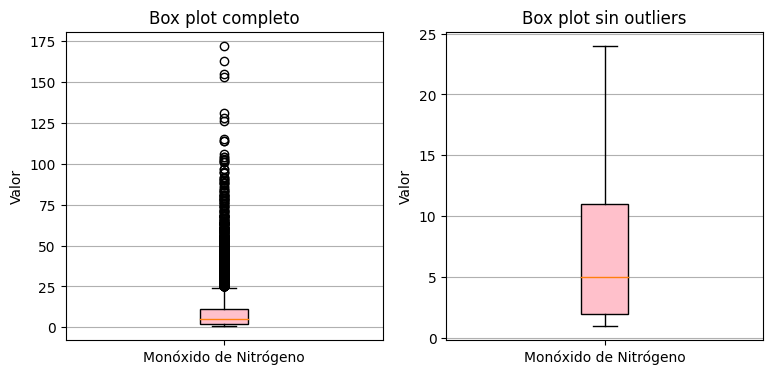

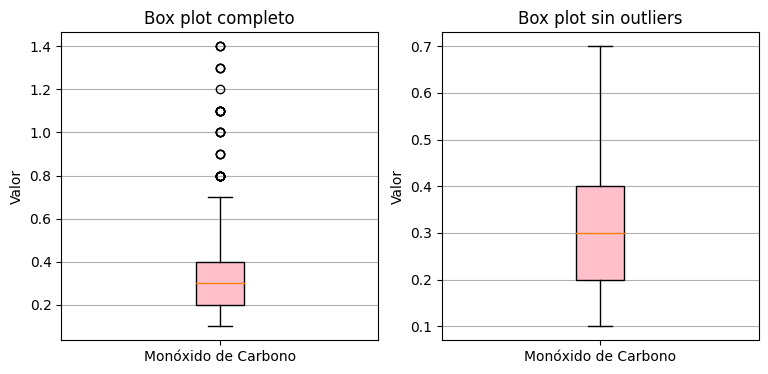

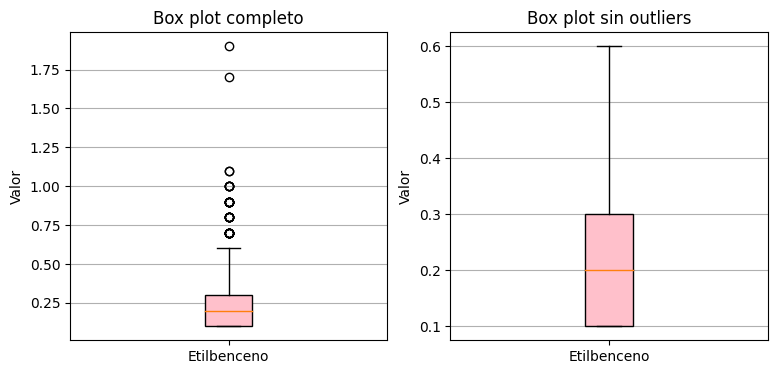

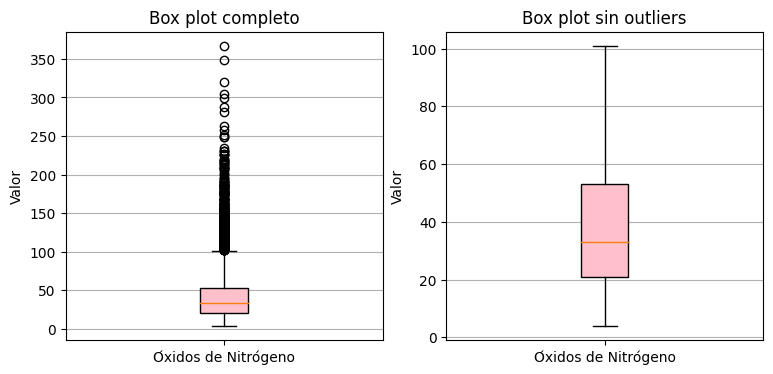

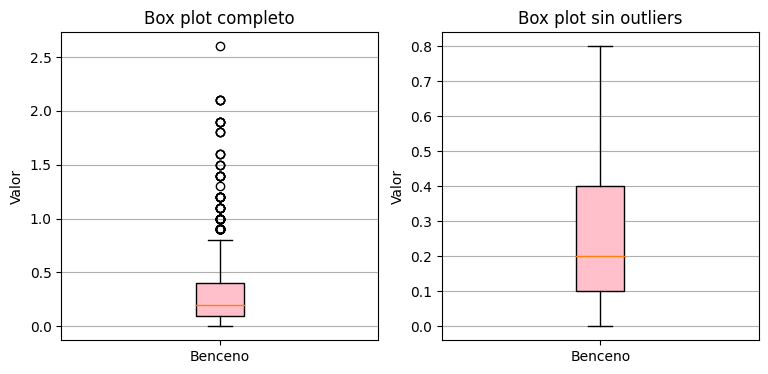

...

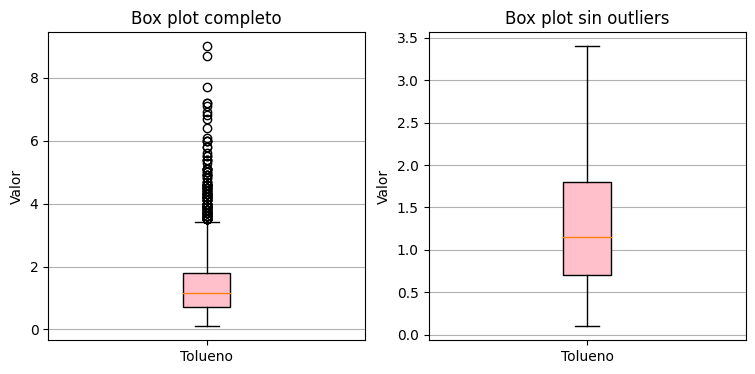

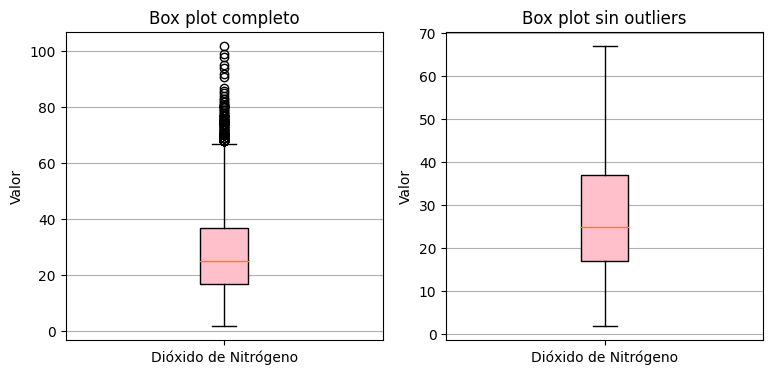

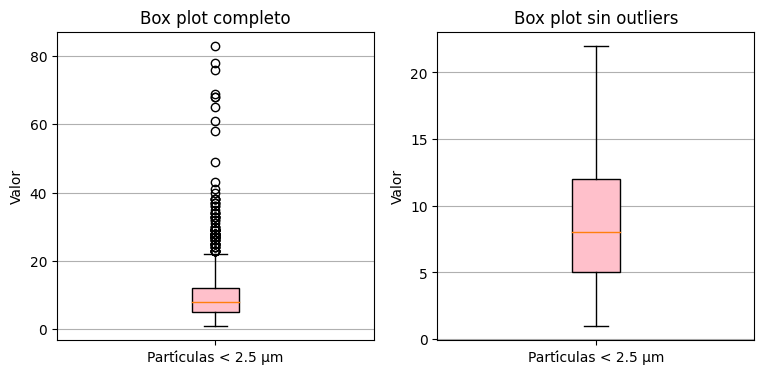

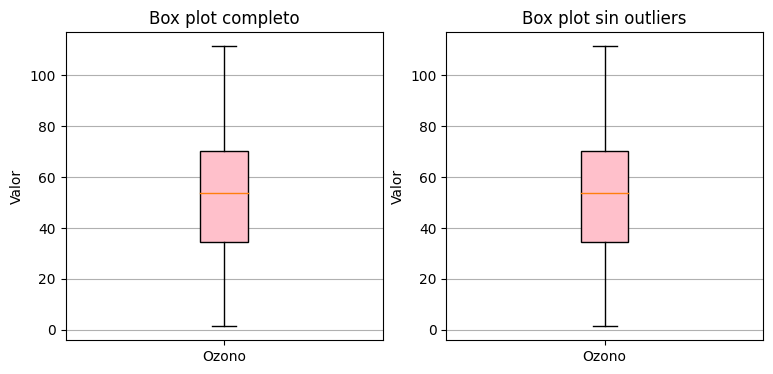

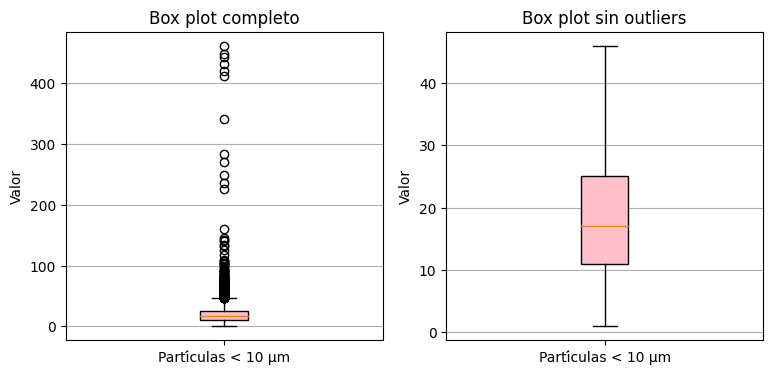

In [31]:
# Vamos a realizar un box plot. Concretamente haremos 2 por cada magnitud: uno con outliers y otro sin ellos
# Hago un bucle para descargar los valores de cada magnitud, almacenarlos en un array y mostrar por pantalla
# 2 Box-plots, uno en el que se muestren los outliers y otro en el que no se muestren
for i in lista_magnitudes: 
# Creo los conjuntos de datos
    x_data_i = df_final_media_2022.loc[df_final_media_2022['MAGNITUD']==i]['VALOR'].reset_index(drop=True)
    descripcion_magnitud = df_magnitudes.loc[i,'Descripcion_Magnitud']
    labels = [descripcion_magnitud]
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))
# Box plot con outliers
    bplot1 = ax1.boxplot(x_data_i,
                     vert=True,
                     patch_artist=True,
                     labels=labels)
    ax1.set_title('Box plot completo')

# Box plot sin outliers
    bplot2 = ax2.boxplot(x_data_i, 0, '',
                     vert=True,
                     patch_artist=True,
                     labels=labels)
    ax2.set_title('Box plot sin outliers')
# Aplico colores 
    colors = ['pink', 'lightblue', 'lightgreen']
    for bplot in (bplot1, bplot2):
        for patch, color in zip(bplot['boxes'], colors):
            patch.set_facecolor(color)

# Añado las líneas horizontales en la cuadrícula
    for ax in [ax1, ax2]:
        ax.yaxis.grid(True)
        ax.set_ylabel('Valor')

plt.show()

Como se puede observar en los Box plots, en casi todos podemos encontrar outliers por encima, que no siguen la distribución normal de la medida.

Lo siguiente que vamos a hacer es representar en un mapa de calor los valores de las medidas medios por mes, así veremos cómo aumentan o disminuyen en función del mes.

In [32]:
# Lo primero que voy a hacer va a ser transformar el dataset. Pasaré las Magnitudes a columnas, 
# para poder ver para cada día y estación, cuál ha sido la medida que se ha tomado para cada magnitud
df_final_transformado = df_final.pivot_table(index=['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LONGITUD','LATITUD','DATE','ANO','MES','DIA'], columns='MAGNITUD', values='VALOR').reset_index()
display(df_final_transformado)

MAGNITUD,ID_ESTACION,NOMBRE_ESTACION,NOM_TIPO,LONGITUD,LATITUD,DATE,ANO,MES,DIA,1,...,9,10,12,14,20,30,35,42,43,44
0,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,2001-01-01,2001,1,01,17.0,...,NaN,NaN,127.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,2001-01-02,2001,1,02,15.0,...,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,2001-01-03,2001,1,03,15.0,...,NaN,NaN,114.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,2001-01-04,2001,1,04,15.0,...,NaN,NaN,108.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Plaza de España,Urbana tráfico,-3.712257,40.423882,2001-01-05,2001,1,05,16.0,...,NaN,NaN,197.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155103,60,Tres Olivos,Urbana fondo,-3.689731,40.500548,2023-04-26,2023,4,26,NaN,...,NaN,15.0,35.0,42.0,NaN,NaN,NaN,NaN,NaN,NaN
155104,60,Tres Olivos,Urbana fondo,-3.689731,40.500548,2023-04-27,2023,4,27,NaN,...,NaN,20.0,42.0,42.0,NaN,NaN,NaN,NaN,NaN,NaN
155105,60,Tres Olivos,Urbana fondo,-3.689731,40.500548,2023-04-28,2023,4,28,NaN,...,NaN,28.0,41.0,53.0,NaN,NaN,NaN,NaN,NaN,NaN
155106,60,Tres Olivos,Urbana fondo,-3.689731,40.500548,2023-04-29,2023,4,29,NaN,...,NaN,16.0,19.0,62.0,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
# Ahora me quedo solo con la información del Mes y del Valor de la magnitud
df_final_2022_mes = df_final_transformado.drop(['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LONGITUD','LATITUD','DATE','ANO','DIA'],axis=1, inplace=False)

# Hago el group by por mes
df_final_2022_mes = df_final_2022_mes.groupby(by='MES').mean()

# Vamos a hacer una pequeña normalización para que se vea bien el mapa de calor
def mean_norm(df_input):
    return df_input.apply(lambda x: (x-x.mean())/ x.std(), axis=0)

df_final_2022_mes = mean_norm(df_final_2022_mes)
display(df_final_2022_mes)

MAGNITUD,1,6,7,8,9,10,12,14,20,30,35,42,43,44
MES,,,,,,,,,,,,,,
1,1.586712,1.519040,1.491180,1.323013,0.884283,-0.648968,1.459043,-1.201120,1.012243,1.572205,1.015784,1.446338,1.586634,1.161155
2,1.273368,0.892218,0.537698,0.767223,0.099508,-0.270896,0.597845,-0.703363,0.217614,0.798430,0.066847,0.367461,0.418856,0.266015
3,0.357634,0.020627,-0.352969,-0.250460,-0.903022,-0.619477,-0.329780,0.059360,-0.801385,-0.050858,-0.843447,-0.268965,-0.081829,-0.515518
4,-0.546621,-0.537394,-0.744920,-0.925329,-1.906259,-1.432599,-0.794303,0.637336,-1.126137,-0.708206,-1.240188,-0.600320,-0.353320,-0.901215
5,-0.820574,-0.840841,-0.822791,-1.055945,-1.493305,-0.989546,-0.885777,0.846520,-0.824713,-0.920355,-1.067012,-1.026446,-0.881137,-1.169319
6,-0.821657,-1.018572,-0.876437,-0.966784,0.082840,0.862537,-0.904454,1.083968,-0.698874,-0.878317,-0.917219,-1.105969,-1.070527,-1.089250
7,-0.860173,-1.057156,-0.904283,-0.857745,1.072754,1.642560,-0.898387,1.333939,-0.776953,-0.932129,-0.819674,-0.971706,-0.963523,-0.911951
8,-0.884514,-1.101691,-0.935785,-1.142579,0.888376,1.724446,-0.993048,1.033431,-0.956660,-1.101280,-0.357391,-0.783749,-0.889151,-0.599252
9,-0.744761,-0.482997,-0.481715,-0.034577,-0.028870,0.371784,-0.373925,0.227582,-0.020398,-0.527953,0.380489,-0.194591,-0.437603,0.161559


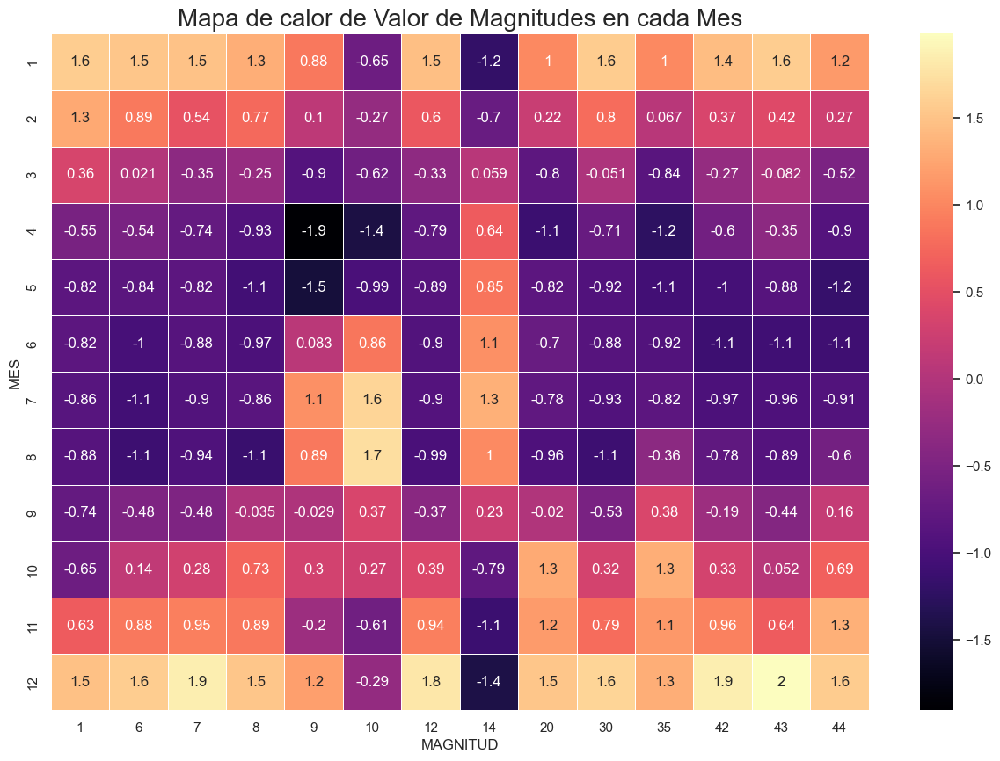

In [34]:
sns.set_theme()

# Represento el mapa de calor
f, ax = plt.subplots(figsize=(15, 10))
#sns.set(rc={"figure.figsize":(15, 10)})

mapa_de_calor_1 = sns.heatmap(df_final_2022_mes, annot=True, linewidths=.5, ax=ax, cmap='magma')
mapa_de_calor_1.set_title('Mapa de calor de Valor de Magnitudes en cada Mes', fontdict={'size':20})
plt.show()

Del mapa de calor extraemos las siguientes conclusiones:

- Para la mayoría de Magnitudes se obtienen las medidas más altas en los meses fríos (desde octubre/noviembre hsata febrero/marzo).
- Para las magnitudes 9 (Partículas < 2.5 um), 10 (Partículas < 10 um) y 14 (Ozono) pasa al contrario, se obtienen los valores más altos en verano, y los más pequeós en invierno.

Una vez más volvemos a comprobar que los gases emitidos y los valores obtenidos en las mediciones son estacionarios, cambiando en gran medida de verano a invierno. 

## 4. Correlación de variables

Para hacer correlación de variables vamos a modificar el dataframe. Vamos a pasar las Magnitudas a columnas, de manera que podamos relacionarlas unas con otras.

Una vez hecho el cambio, vamos a eliminar todas las columnas que nos dan información de la medida dejando sólo los valores de las magnitudes, para que podamos correlacionar las magnitudes unas con otras, que al final es lo interesante:

MAGNITUD,1,6,7,8,9,10,12,14,20,30,35,42,43,44
0,17.0,0.8,45.0,58.0,NaN,NaN,127.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,15.0,0.5,12.0,60.0,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,15.0,0.6,32.0,65.0,NaN,NaN,114.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,15.0,0.5,29.0,63.0,NaN,NaN,108.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,16.0,1.0,91.0,57.0,NaN,NaN,197.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155103,NaN,NaN,8.0,23.0,NaN,15.0,35.0,42.0,NaN,NaN,NaN,NaN,NaN,NaN
155104,NaN,NaN,7.0,32.0,NaN,20.0,42.0,42.0,NaN,NaN,NaN,NaN,NaN,NaN
155105,NaN,NaN,7.0,30.0,NaN,28.0,41.0,53.0,NaN,NaN,NaN,NaN,NaN,NaN
155106,NaN,NaN,3.0,14.0,NaN,16.0,19.0,62.0,NaN,NaN,NaN,NaN,NaN,NaN


/usr/local/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


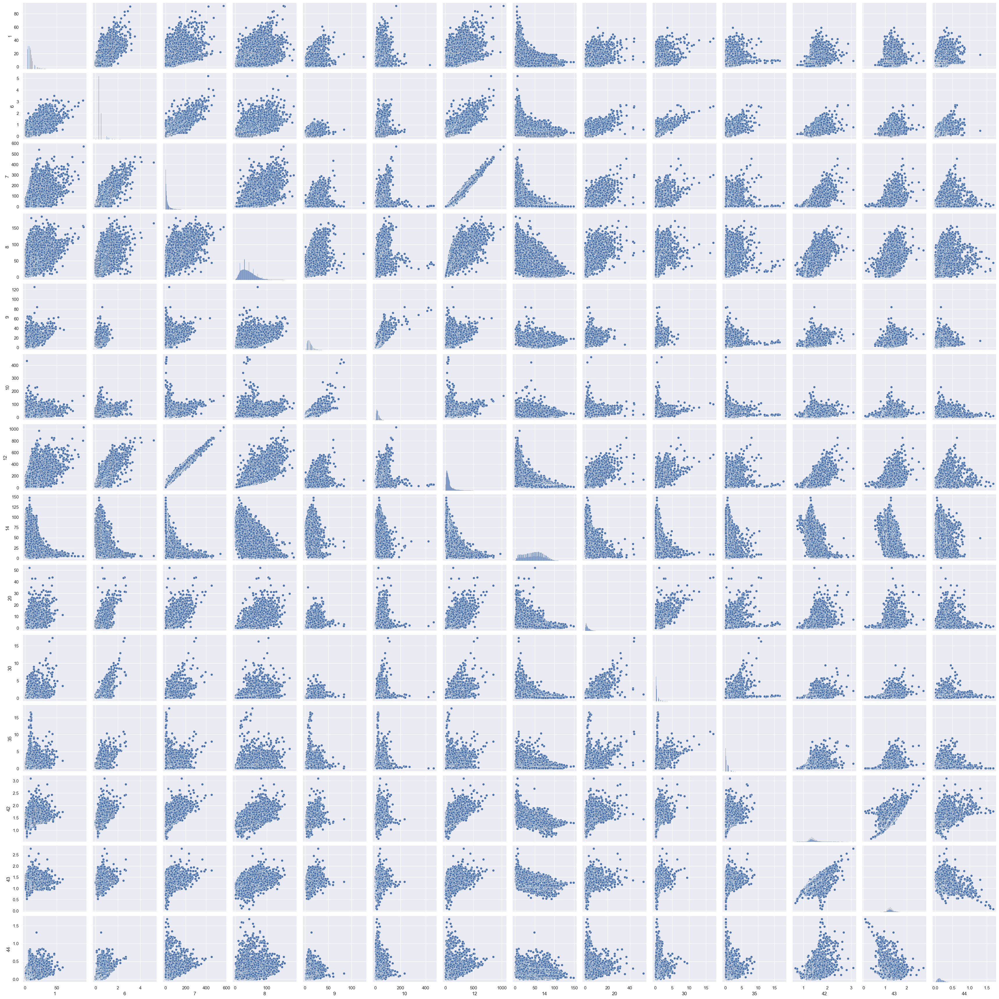

In [35]:
# Elimino las columnas que me sobran
df_final_transformado_correlacion = df_final_transformado.drop(['ID_ESTACION','NOMBRE_ESTACION','NOM_TIPO','LONGITUD','LATITUD','DATE','ANO','MES','DIA'],axis=1, inplace=False)
display(df_final_transformado_correlacion)

# Creo la correlación entre las magnitudes e imprimo el gráfico (puede tardar un poquito)
correlaciones = sns.pairplot(df_final_transformado_correlacion)
plt.show()

Para ver un poco mejor la correlación entre variables (en juego de colores) vamos a hacer otro mapa de calor pero de correlaciones

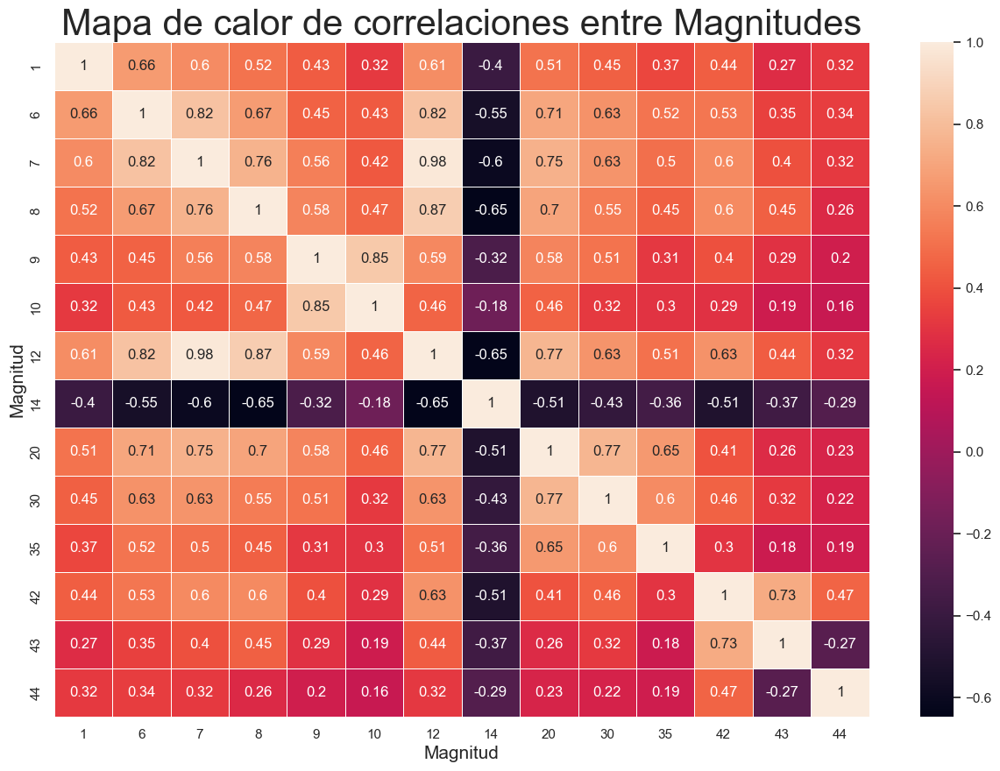

In [36]:
# Defino el tema de la figura y el tamaño
sns.set_theme(style="whitegrid")
sns.set(rc={"figure.figsize":(15, 10)})

# Defino el conjunto de datos, creo la correlación entre las variables y creo el gráfico
df_final_transformado_correlacion = df_final_transformado_correlacion.rename_axis(None, axis=1)
corr_mat = df_final_transformado_correlacion.corr()
mapa_de_calor_2 = sns.heatmap(corr_mat,annot=True, linewidth=.5)
mapa_de_calor_2.set_title('Mapa de calor de correlaciones entre Magnitudes', fontdict={'size':30})
mapa_de_calor_2.set_xlabel('Magnitud',fontdict={'size':15})
mapa_de_calor_2.set_ylabel('Magnitud',fontdict={'size':15})
plt.show()

Echando un vistazo por encima al gráfico y al mapa de calor con las correlaciones entre las magnitudes podemos extraer las siguientes conclusiones:

- La magnitud 12 (Óxidos de Nitrógeno) y la magnitud 7(Monóxido de Nitrógeno) tienen una correlación líneal positiva perfecta. De igual forma, ambas están bastante correlacionadas linealmente en positivo con la magnitud 8 (Dióxido de Nitrógeno). Tiene sentido, al tratarse las tres de medidas del mismo gas.
- Vemos que la magnitud 14 (Ozono) tiene por lo general una correlación no lineal negativa con muchas variables, como si los límites de ambos x tendiesen a cero (lim(x) y->infinito = 0, lim(y) x->infinito = 0). Por debajo de esa línea bien definida se encuentran todas las medidas.

## 5. Conclusiones

Después de todo el análisis que se ha realizado a lo largo del trabajo podemos llegar a las siguientes conclusiones:

- Existe una variación significativa en las medidas en función del momento de tomarlas. Se puede decir que obedece a una tendencia estacionaria, es decir, dependiendo de si es verano o invierno se observaran unos valores u otros. Esto puede deberse a diferentes factores
  1. La cantidad de gente que haya en la ciudad (en verano habrá menos gente que en invierno, por las vacaciones, lo que implica menos coches, menos gases...)
  2. La cantidad de calefacción utilizada (en verano no se utiliza nada mientras que en invierno se utiliza continuamente)
- Por lo general no existe mucha diferencia entre las medidas tomadas en las estaciones del centro de la ciudad y las suburbanas
- Gracias a las últimas medidas tomadas en la ciudad con el objetivo de cuidar el medio ambiente (como la creación de la zona de Madrid Central, entre otras) ha colaborado positivamente a que las emisiones de los gases se hayan disminuido, lo que se puede ver reflejado en la disminución de los últimos años en las medidas.

### 5.1. FUTUROS PASOS DEL ANÁLISIS

Hasta este momento tan sólo se ha realizado un análisis exploratorio, estadístico y gráfico de los conjuntos de datos de los que disponíamos, pero no se ha llegado a establecer una relación real entre sus datos que aporten un valor real y un significado. Para continuar el análisis se podrían realizar las siguientes acciones:
- Investigar sobre los límites legales/razonables establecidos por las autoridades competentes sobre cada Magnitud y comparar con el nivel de la ciudad en cada momento
- Crear un modelo de predicción de emisiones de gases al aire de Madrid, que nos permita saber el futuro que nos espera
- Buscar patrones entre las magnitudes que den lugar a explicaciones razonables (por ejemplo, si baja *x* magnitud inmediatamente después baja *y* magnitud)
- Intentar buscar acontecimientos históricos de Madrid que puedan coincidir con las medidas extremas de cada magnitud, para encontrar una razón real a tanta desviación en la medida (se me ocurre un ejemplo no muy científico: con los atentados de Atocha se pudieron emitir muchos más gases de los acostumbrados en esa época del año)